### **Setup**

##### Installing the Library

In [ ]:
# Install sqlalchemy library
!pip3 install sqlalchemy
# Install sqlalchemy_schemadisplay library
!pip3 install sqlalchemy_schemadisplay

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for sqlalchemy_schemadisplay: filename=sqlalchemy_schemadisplay-1.3-py3-none-any.whl size=5930 sha256=c519b9f8b5456fdc8838a41521fa67079a55c6cd63d993be4a376a8bb2f6cf81
  Stored in directory: /root/.cache/pip/wheels/f3/8b/c1/2d2e16626d607f62c3fe91c290920dfe873bf5c024e6e28fbb
Successfully built sqlalchemy_schemadisplay


##### Importing the Libraries and Datasets

In [ ]:
# importing the pandas library 
import pandas as pd 
# importing matplotlib library
import matplotlib.pyplot as plt 
# importing numpy library
import numpy as np 
# importing seaborn library
import seaborn as sns 
# importing preprocessing module from sklearn library
from sklearn import preprocessing 
%matplotlib inline
# importing datetime module from datetime library
from datetime import datetime 
# importing Path module from pathlib library
from pathlib import Path
# importing sqlite3 library
import sqlite3
# importing MetaData module from sqlalchemy library
from sqlalchemy import MetaData
# importing create_schema_graph module from sqlalchemy_schemadisplay library
# from sqlalchemy_schemadisplay import create_schema_graph
# importing create_engine module from sqlalchemy library
from sqlalchemy import create_engine
# importing PowerTransformer module from sklearn.decomposition
from sklearn.decomposition import PCA
# importing PowerTransformer module from sklearn.preprocessing
from sklearn.preprocessing import PowerTransformer
# import KMeans from sklearn.cluster
from sklearn.cluster import KMeans
# import silhouette_score from sklearn.metrics
from sklearn.metrics import silhouette_score
# applying option to view all the columns
pd.set_option('display.max_columns', None)
# import StandardScaler from sklearn.preprocessing
from sklearn.preprocessing import StandardScaler

In [ ]:
# importing the dataset from csv format and storing it in dataframe named 'baskets','category_spends','customers' and 'lineitems'
baskets = pd.read_csv('/content/baskets_sample.csv')
category_spends = pd.read_csv('/content/category_spends_sample.csv')
customers = pd.read_csv('/content/customers_sample.csv')
lineitems = pd.read_csv('/content/lineitems_sample.csv')

### **Understanding the Datasets**

Checking the data types, null values, number of columns and rows and viewing the contents in all datasets.

In [ ]:
# 1) Baskets

# Printing number of rows and columns
print("The baskets dataset has", baskets.shape[1], "columns and", baskets.shape[0], "rows.\n") 

# Printing number of duplicated rows
print("The baskets dataset has", baskets[baskets.duplicated()].shape[0], "duplicated rows.") 

# Printing number of unique customers in the dataset
print("\nThe number of unique customers as per baskets_sample is",baskets['customer_number'].nunique())
print()

# Printing number of missing (NULL) values in the dataset
print("The number of null values present in baskets dataset are as follows:\n")
print(baskets.isna().sum())
print()

# Checking no-null values and data types of the dataset
baskets.info()
print()

# View Dataset
baskets.head()

The baskets dataset has 5 columns and 195547 rows.

The baskets dataset has 0 duplicated rows.

The number of unique customers as per baskets_sample is 3000

The number of null values present in baskets dataset are as follows:

customer_number      0
purchase_time        0
basket_quantity      0
basket_spend         0
basket_categories    0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195547 entries, 0 to 195546
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   customer_number    195547 non-null  int64 
 1   purchase_time      195547 non-null  object
 2   basket_quantity    195547 non-null  int64 
 3   basket_spend       195547 non-null  object
 4   basket_categories  195547 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 7.5+ MB



,customer_number,purchase_time,basket_quantity,basket_spend,basket_categories
0,11911,2007-03-01 07:06:00,7,£3.09,3
1,4047,2007-03-01 07:13:00,9,£7.99,5
2,3571,2007-03-01 07:27:00,9,£37.06,6
3,4079,2007-03-01 07:34:00,11,£11.91,5
4,6063,2007-03-01 07:36:00,3,£1.45,1


In [ ]:
# 2) Category Spends

# Printing number of rows and columns
print("The category_spends dataset has", category_spends.shape[1], "columns and", category_spends.shape[0], "rows.\n") 

# Printing number of duplicated rows
print("The category_spends dataset has", category_spends[category_spends.duplicated()].shape[0], "duplicated rows.") 

# Printing number of unique customers in the dataset
print("\nThe number of unique customers as per category_spends_sample is",category_spends['customer_number'].nunique())
print()

# Printing number of missing (NULL) values in the dataset
print("The number of null values present in category_spends dataset are as follows:\n")
print(category_spends.isna().sum())
print()

# Checking no-null values and data types of the dataset
category_spends.info()
print()

# View Dataset
category_spends.head()

The category_spends dataset has 21 columns and 3000 rows.

The category_spends dataset has 0 duplicated rows.

The number of unique customers as per category_spends_sample is 3000

The number of null values present in category_spends dataset are as follows:

customer_number         0
fruit_veg               0
dairy                   0
confectionary           0
grocery_food            0
grocery_health_pets     0
bakery                  0
newspapers_magazines    0
prepared_meals          0
soft_drinks             0
frozen                  0
meat                    0
tobacco                 0
drinks                  0
deli                    0
world_foods             0
lottery                 0
cashpoint               0
seasonal_gifting        0
discount_bakery         0
practical_items         0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------             

,customer_number,fruit_veg,dairy,confectionary,grocery_food,grocery_health_pets,bakery,newspapers_magazines,prepared_meals,soft_drinks,frozen,meat,tobacco,drinks,deli,world_foods,lottery,cashpoint,seasonal_gifting,discount_bakery,practical_items
0,11387,£64.58,£35.91,£107.78,£27.08,£29.59,£0.00,£54.83,£6.35,£22.83,£21.51,£28.62,£162.10,£28.02,£28.12,£28.54,£2.00,£15.00,£7.48,£0.00,£0.84
1,8171,£16.89,£37.24,£28.84,£33.43,£66.40,£0.00,£22.06,£12.09,£2.34,£78.74,£26.44,£0.00,£8.42,£2.65,£3.76,£0.00,£0.00,£9.99,£0.00,£0.00
2,1060,£87.30,£82.98,£49.88,£20.57,£37.04,£0.00,£9.85,£57.98,£31.12,£14.53,£54.65,£0.00,£0.00,£2.60,£0.00,£18.00,£20.00,£106.46,£0.00,£0.00
3,3728,£84.05,£186.56,£175.50,£119.84,£111.08,£0.00,£13.05,£25.54,£124.42,£15.24,£0.95,£127.70,£0.00,£0.00,£0.00,£4.00,£0.00,£0.00,£0.00,£4.50
4,14621,£35.16,£121.31,£79.23,£29.03,£37.17,£0.00,£40.06,£0.00,£4.68,£3.33,£36.24,£0.00,£2.55,£99.16,£0.00,£0.00,£0.00,£3.40,£0.00,£0.00


In [ ]:
# 3) Customers

# Printing number of rows and columns
print("The customers dataset has", customers.shape[1], "columns and", customers.shape[0], "rows.\n") 

# Printing number of duplicated rows
print("The customers dataset has", customers[customers.duplicated()].shape[0], "duplicated rows.") 

# Printing number of unique customers in the dataset
print("\nThe number of unique customers as per customers_sample is",customers['customer_number'].nunique())
print()

# Printing number of missing (NULL) values in the dataset
print("The number of null values present in customers dataset are as follows:\n")
print(customers.isna().sum())
print()

# Checking no-null values and data types of the dataset
customers.info()
print()

# View Dataset
customers.head()

The customers dataset has 6 columns and 3000 rows.

The customers dataset has 0 duplicated rows.

The number of unique customers as per customers_sample is 3000

The number of null values present in customers dataset are as follows:

customer_number     0
baskets             0
total_quantity      0
average_quantity    0
total_spend         0
average_spend       0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customer_number   3000 non-null   int64  
 1   baskets           3000 non-null   int64  
 2   total_quantity    3000 non-null   int64  
 3   average_quantity  3000 non-null   float64
 4   total_spend       3000 non-null   object 
 5   average_spend     3000 non-null   object 
dtypes: float64(1), int64(3), object(2)
memory usage: 140.8+ KB



,customer_number,baskets,total_quantity,average_quantity,total_spend,average_spend
0,4749,220,260,1.181818,£631.12,£2.87
1,4757,248,333,1.342742,£452.42,£1.82
2,144,226,303,1.340708,£261.16,£1.16
3,572,285,346,1.214035,£638.79,£2.24
4,669,285,324,1.136842,£561.42,£1.97


In [ ]:
# 4) Lineitems

# Printing number of rows and columns
print("The lineitems dataset has", lineitems.shape[1], "columns and", lineitems.shape[0], "rows.\n") 

# Printing number of duplicated rows
print("The lineitems dataset has", lineitems[lineitems.duplicated()].shape[0], "duplicated rows.") 

# Printing number of unique customers in the dataset
print("\nThe number of unique customers as per lineitems_sample is",lineitems['customer_number'].nunique())
print()

# Printing number of missing (NULL) values in the dataset
print("The number of null values present in customers dataset are as follows:\n")
print(lineitems.isna().sum())
print()

# Checking no-null values and data types of the dataset
lineitems.info()
print()

# View Dataset
lineitems.head()

The lineitems dataset has 6 columns and 1461315 rows.

The lineitems dataset has 114 duplicated rows.

The number of unique customers as per lineitems_sample is 3000

The number of null values present in customers dataset are as follows:

customer_number    0
purchase_time      0
product_id         0
category           0
quantity           0
spend              0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461315 entries, 0 to 1461314
Data columns (total 6 columns):
 #   Column           Non-Null Count    Dtype 
---  ------           --------------    ----- 
 0   customer_number  1461315 non-null  int64 
 1   purchase_time    1461315 non-null  object
 2   product_id       1461315 non-null  int64 
 3   category         1461315 non-null  object
 4   quantity         1461315 non-null  int64 
 5   spend            1461315 non-null  object
dtypes: int64(3), object(3)
memory usage: 66.9+ MB



,customer_number,purchase_time,product_id,category,quantity,spend
0,14577,2007-03-10 11:58:00,722653,GROCERY_FOOD,1,£1.39
1,7210,2007-03-22 10:53:00,696136,GROCERY_HEALTH_PETS,1,£4.25
2,3145,2007-03-26 11:17:00,139543,GROCERY_HEALTH_PETS,1,£0.50
3,2649,2007-03-12 16:05:00,34890,BAKERY,1,£0.57
4,859,2007-03-10 09:53:00,613984,BAKERY,1,£1.59


### **Cleaning provided Datasets**

In [ ]:
# Defining a function for cleaning the datasets which takes Dataframe df as input
def data_clean(df):
  # Replace substring containing Pound logo '£' and comma ',' from entire 'customers' dataframe. Regex=True ensures substrings are taken into consideration
  df.replace({'£':'',',':''},inplace=True,regex=True)
  # Convert all columns to numeric type (float or integer)
  df = df.apply(pd.to_numeric)
  # Drop rows having Null/Missing values
  df.dropna(inplace=True)
  # Return the dataframe df
  return df

# Use data_clean function to clean the tables
customers = data_clean(customers)
lineitems['spend'] = data_clean(lineitems['spend'])
category_spends = data_clean(category_spends)
baskets['basket_spend'] = data_clean(baskets['basket_spend'])

# View cleaned dataset for lineitems table
lineitems.head()


,customer_number,purchase_time,product_id,category,quantity,spend
0,14577,2007-03-10 11:58:00,722653,GROCERY_FOOD,1,1.39
1,7210,2007-03-22 10:53:00,696136,GROCERY_HEALTH_PETS,1,4.25
2,3145,2007-03-26 11:17:00,139543,GROCERY_HEALTH_PETS,1,0.50
3,2649,2007-03-12 16:05:00,34890,BAKERY,1,0.57
4,859,2007-03-10 09:53:00,613984,BAKERY,1,1.59


In [ ]:
lineitems['category'].unique()

array(['GROCERY_FOOD', 'GROCERY_HEALTH_PETS', 'BAKERY', 'PREPARED_MEALS',
       'FROZEN', 'SEASONAL_GIFTING', 'CONFECTIONARY',
       'NEWSPAPERS_MAGAZINES', 'SOFT_DRINKS', 'MEAT', 'DRINKS', 'DELI',
       'CASHPOINT', 'DAIRY', 'TOBACCO', 'PRACTICAL_ITEMS', 'WORLD_FOODS',
       'LOTTERY', 'FRUIT_VEG', 'DISCOUNT_BAKERY'], dtype=object)

### **Setup for using SQL queries**

In [ ]:
# Creating SQLite .db database to store the data tables
Path('data.db').touch()

#  Creating SQLite connection to connect to the SQLite database (data.db)
con = sqlite3.connect('data.db')

# Creates a SQLAlchemy engine object to connects to a SQLite database named data.db in the current working directory. The engine object is responsible for connecting to the database and executing SQL queries.
engine = create_engine('sqlite:///data.db')

# MetaData object stores information about the database schema, such as the tables, columns, and relationships
meta = MetaData(bind=engine)

# Connecting to Database using engine object
engine.connect()

# Check whether the connection is working or not 
print(engine)

# Using the defined connection 'con' to upload the tables in SQLite format
lineitems.to_sql('lineitems', con,  index=False)

<ipython-input-10-0e837792599f>:11: RemovedIn20Warning: Deprecated API features detected! These feature(s) are not compatible with SQLAlchemy 2.0. To prevent incompatible upgrades prior to updating applications, ensure requirements files are pinned to "sqlalchemy<2.0". Set environment variable SQLALCHEMY_WARN_20=1 to show all deprecation warnings.  Set environment variable SQLALCHEMY_SILENCE_UBER_WARNING=1 to silence this message. (Background on SQLAlchemy 2.0 at: https://sqlalche.me/e/b8d9)
  meta = MetaData(bind=engine)


Engine(sqlite:///data.db)


### **Re-generating the tables and creational additional features from lineitems table.**

It has been observed from the above given datasets, that there are some descripancies in values such as 'bakery' column in 'category_spends' table has all zero values; 'baskets' column in 'customers' table has incorrect values.

To avaoid any error in the analysis, the given tables are regenerated along with creation of additional new features. 

In [ ]:
# 1) new_basket table

# Generate a new table 'new_baskets' from lineitems table using aggregate functions in SQL query to genearte basket level information
new_basket= pd.read_sql_query("""SELECT customer_number, purchase_time, COUNT(*) AS basket_category, SUM(spend) AS basket_spend, AVG(spend) AS avg_category_spend, SUM(quantity) AS basket_quantity, AVG(quantity) AS avg_category_quantity
                                    FROM lineitems 
                                    GROUP BY customer_number, purchase_time""", con)

# Converting from 'str' type to 'datetime'
new_basket['purchase_time']= pd.to_datetime(new_basket['purchase_time'],format='%Y-%m-%d %H:%M:%S')

# Extracting purchase date from time stamp
new_basket['purchase_date'] = new_basket['purchase_time'].map(lambda a: a.date())

# Extracting day of the week from time stamp . Monday is  denoted by 0 and Sunday by 6
new_basket['day_of_week'] = new_basket['purchase_time'].map(lambda a: a.weekday())

# Mapping week day number to its corresponding day
Days = {0: "Monday",1: "Tuesday",2: "Wednesday",3: "Thursday",4: "Friday",5: "Saturday",6: "Sunday"}
new_basket["day_of_week"] = new_basket["day_of_week"].map(Days)

# creating bins for defining sessions in a day
time_period = [0,6,11,15,19,23]
day_time = ['Night','Morning','Noon','Eve','Night']

# Assigning categories ('Morning','Noon','Eve','Night') based on the bins created i.e based on time of the day
new_basket['session'] = pd.cut(new_basket['purchase_time'].dt.hour, bins=time_period, labels=day_time, include_lowest=True,ordered=False)

# Removing redundant column - "purchase_time"
new_basket.drop(['purchase_time'],axis=1,inplace=True)

# Pushing new_basket to sql database
new_basket.to_sql('new_basket', con,  index=False)

# Viewing the dataset
new_basket.head()

,customer_number,basket_category,basket_spend,avg_category_spend,basket_quantity,avg_category_quantity,purchase_date,day_of_week,session
0,14,10,16.81,1.681000,10,1.000000,2007-03-03,Saturday,Noon
1,14,10,15.74,1.574000,18,1.800000,2007-03-10,Saturday,Noon
2,14,9,14.75,1.638889,11,1.222222,2007-03-21,Wednesday,Eve
3,14,2,2.00,1.000000,2,1.000000,2007-03-23,Friday,Eve
4,14,4,3.61,0.902500,4,1.000000,2007-03-26,Monday,Eve


In [ ]:
# Finding the latest date of transaction, in order to calculate recency with respect to that date
np.max(new_basket.purchase_date)

datetime.date(2007, 8, 31)

In [ ]:
# 2) new_customers table

# Generate a new table 'new_customers' from lineitems table using aggregate functions in SQL query to generate customer level information
new_customers= pd.read_sql_query("""SELECT customer_number,COUNT(*) AS no_of_purchases, SUM(basket_quantity) AS total_quantity, AVG(basket_quantity) AS avg_basket_quantity, SUM(basket_spend) AS total_spend, AVG(basket_spend) AS avg_basket_spend, AVG(basket_category) AS avg_basket_category, MAX(purchase_date) AS last_purchase,  MIN(purchase_date) AS first_purchase
                                    FROM new_basket
                                    GROUP BY customer_number""", con)

# Convert date from string type to datetime object
new_customers['last_purchase']= pd.to_datetime(new_customers['last_purchase'], format='%Y-%m-%d')

# Convert date from string type to datetime object
new_customers['first_purchase']= pd.to_datetime(new_customers['first_purchase'], format='%Y-%m-%d')

# Calculate new feature 'Recency' with respect to latest transaction date of entire dataset and using 'recent_purchase' date of customers 
new_customers['recency'] = (datetime.strptime('2007/08/31', "%Y/%m/%d") - new_customers['last_purchase']).astype(str).replace('days','', regex=True).astype(int)

# Calculate average interval between 2 visits
new_customers['avg_visit_interval'] = ((new_customers['last_purchase'] - new_customers['first_purchase']).astype(str).replace('days','', regex=True).astype(int))/new_customers['no_of_purchases']

# Calculate average spend per item
new_customers['avg_spend_per_item'] = new_customers['total_spend']/new_customers['total_quantity']

# Dropping the redundant columns
new_customers.drop(['last_purchase','first_purchase'],axis=1,inplace=True)

# View the table
new_customers.head()

,customer_number,no_of_purchases,total_quantity,avg_basket_quantity,total_spend,avg_basket_spend,avg_basket_category,recency,avg_visit_interval,avg_spend_per_item
0,14,56,531,9.482143,675.72,12.066429,6.803571,1,3.214286,1.272542
1,45,33,655,19.848485,585.73,17.749394,17.000000,1,5.515152,0.894244
2,52,59,294,4.983051,222.18,3.765763,3.491525,2,2.966102,0.755714
3,61,37,499,13.486486,547.87,14.807297,11.351351,3,4.837838,1.097936
4,63,48,281,5.854167,293.34,6.111250,5.583333,7,3.645833,1.043915


In [ ]:
# 3) new_day_spend table

# Generate a new table 'new_category_spends' from lineitems table using aggregate functions in SQL query
new_day_spend = pd.read_sql_query("""SELECT customer_number, day_of_week, SUM(basket_spend) AS total_spend
                                     FROM new_basket 
                                     GROUP BY customer_number, day_of_week""",con)

# View the table
new_day_spend.head()

# Pivot the table to change the layout of the table so that each category of product is represented as columns and take into account only spend
new_day_spend = new_day_spend.pivot(index='customer_number',columns='day_of_week',values='total_spend')

# To change the index column from 'day_of_week' to default index values
new_day_spend.reset_index(inplace=True)
new_day_spend = new_day_spend.rename_axis(None, axis=1)

# Replace NUll values with zero because null values shows that customer has not spent on that product category
new_day_spend[new_day_spend.isnull()]=0

# Creating new features 'total_spend_weekend' and 'total_spend_weekday'
new_day_spend['total_spend_weekend'] = new_day_spend[['Saturday','Sunday']].sum(axis=1)
new_day_spend['total_spend_weekday'] = new_day_spend[['Monday','Tuesday','Wednesday','Thursday','Friday']].sum(axis=1)

# Dropping the redundant columns
new_day_spend.drop(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],axis=1,inplace=True)

new_day_spend.head()

,customer_number,total_spend_weekend,total_spend_weekday
0,14,393.18,282.54
1,45,0.00,585.73
2,52,8.14,214.04
3,61,88.73,459.14
4,63,41.20,252.14


In [ ]:
# 4) new_session_spend table

# Generate a new table 'new_category_spends' from lineitems table using aggregate functions in SQL query
new_session_spend = pd.read_sql_query("""SELECT customer_number, session, SUM(basket_spend) AS total_spend
                                         FROM new_basket 
                                         GROUP BY customer_number, session""",con)

# View the table
new_session_spend.head()

# Pivot the table to change the layout of the table so that each category of product is represented as columns
new_session_spend = new_session_spend.pivot(index='customer_number',columns='session',values='total_spend')

# To change the index column from 'session' to default index values
new_session_spend.reset_index(inplace=True)
new_session_spend = new_session_spend.rename_axis(None, axis=1)

# Replace NUll values with zero because null values shows that customer has not spent during that session
new_session_spend[new_session_spend.isnull()]=0

# Creating new features 'total_spend_daytime' and 'total_spend_night'
new_session_spend['total_spend_daytime'] = new_session_spend['Morning']+new_session_spend['Noon']
new_session_spend['total_spend_night'] = new_session_spend['Eve']+new_session_spend['Night']

# Dropping the redundant columns
new_session_spend.drop(['Morning','Noon','Eve','Night'],axis=1,inplace=True)

new_session_spend.head()

,customer_number,total_spend_daytime,total_spend_night
0,14,350.47,325.25
1,45,497.77,87.96
2,52,206.90,15.28
3,61,313.08,234.79
4,63,250.07,43.27


In [ ]:
# 5) new_category_spends table

# Generate a new table 'new_category_spends' from lineitems table using aggregate functions in SQL query
new_category_spends = pd.read_sql_query("""SELECT customer_number, category, SUM(spend) AS total_spend
                                            FROM lineitems 
                                            GROUP BY customer_number, category""",con)

# View the table
new_category_spends.head()

# Pivot the table to change the layout of the table so that each category of product is represented as columns
new_category_spends = new_category_spends.pivot(index='customer_number',columns='category',values='total_spend')

# To change the index column from 'customer_number' to default index values
new_category_spends.reset_index(inplace=True)
new_category_spends = new_category_spends.rename_axis(None, axis=1)

# Replace NUll values with zero because null values shows that customer has not spent on that product category
new_category_spends[new_category_spends.isnull()]=0

# Creating new features 'total_spend_food' and 'total_spend_nonfood'
new_category_spends['total_spend_food'] = new_category_spends[['BAKERY', 'CONFECTIONARY', 'DAIRY', 'DELI', 'DRINKS','FROZEN', 'FRUIT_VEG', 'GROCERY_FOOD', 'MEAT', 'PREPARED_MEALS', 'SOFT_DRINKS', 'WORLD_FOODS','DISCOUNT_BAKERY']].sum(axis=1)
new_category_spends['total_spend_nonfood'] = new_category_spends[['CASHPOINT','GROCERY_HEALTH_PETS','NEWSPAPERS_MAGAZINES', 'PRACTICAL_ITEMS','SEASONAL_GIFTING','TOBACCO','LOTTERY']].sum(axis=1)

new_category_spends.head()

,customer_number,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS,total_spend_food,total_spend_nonfood
0,14,18.09,0.0,23.22,172.58,0.00,1.25,113.45,25.29,11.10,56.05,11.28,0.0,182.37,6.40,0.00,23.36,5.07,5.31,0.0,20.90,652.97,22.75
1,45,18.00,0.0,106.54,142.16,2.00,0.00,0.00,7.05,30.21,83.42,24.31,0.0,60.31,17.49,0.00,56.51,0.00,29.65,0.0,8.08,543.93,41.80
2,52,2.45,10.0,3.29,5.19,49.07,0.00,0.00,1.78,53.29,1.08,12.11,1.0,9.74,3.12,0.00,2.78,23.20,8.98,0.0,35.10,172.75,49.43
3,61,32.75,0.0,46.39,55.29,19.88,0.00,20.65,18.63,70.18,56.18,45.71,6.0,121.38,5.55,2.87,12.12,3.04,14.87,0.0,16.38,484.70,63.17
4,63,33.35,0.0,73.07,42.11,32.14,0.00,0.00,14.53,22.01,13.54,25.08,3.0,3.46,2.00,0.00,13.38,0.00,1.67,0.0,14.00,263.26,30.08


### **Merging datasets to get final dataset**

In [ ]:
# Merge the new_customers table with the new_category_spends, new_day_spend and new_session_spend tables by mapping 'customer_number' columns
final = new_customers.merge(new_category_spends,on='customer_number',how='inner').merge(new_day_spend,on='customer_number',how='inner').merge(new_session_spend,on='customer_number',how='inner')

# Extracting input data from the dataset
input = final.iloc[:,1:] 

# Print no. of rows and columns for the selected features
print(input.shape)

# View first five rows of the dataset
print(input.head())

(3000, 35)
   no_of_purchases  total_quantity  avg_basket_quantity  total_spend  \
0               56             531             9.482143       675.72   
1               33             655            19.848485       585.73   
2               59             294             4.983051       222.18   
3               37             499            13.486486       547.87   
4               48             281             5.854167       293.34   

   avg_basket_spend  avg_basket_category  recency  avg_visit_interval  \
0         12.066429             6.803571        1            3.214286   
1         17.749394            17.000000        1            5.515152   
2          3.765763             3.491525        2            2.966102   
3         14.807297            11.351351        3            4.837838   
4          6.111250             5.583333        7            3.645833   

   avg_spend_per_item  BAKERY  CASHPOINT  CONFECTIONARY   DAIRY   DELI  \
0            1.272542   18.09        0.0   

### **Exploration of the market**

In [72]:
# Get statistical summary for all the input features
input.describe()

,no_of_purchases,total_quantity,avg_basket_quantity,total_spend,avg_basket_spend,avg_basket_category,recency,avg_visit_interval,avg_spend_per_item,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS,total_spend_food,total_spend_nonfood,total_spend_weekend,total_spend_weekday,total_spend_daytime,total_spend_night
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,65.182333,583.722000,11.273373,769.412937,14.801139,9.316676,8.121333,4.298314,1.394845,38.210123,45.330583,57.347793,71.302683,13.736440,1.814837,62.242217,35.466020,69.456163,60.007530,60.909867,14.165603,54.740687,16.653390,2.016220,35.48057,6.126987,23.303350,92.547613,8.554260,531.662673,237.750263,185.874840,583.538097,561.110257,208.302680
std,47.464717,405.006359,8.538046,552.769022,11.161440,6.806443,20.938531,3.592902,0.567437,36.496115,123.584361,55.959350,57.966265,25.486136,9.450367,121.500365,41.477609,70.499654,57.682533,69.805023,48.469754,67.802126,26.377091,4.322232,41.24047,13.104271,35.695592,201.703812,14.757745,393.380729,291.528575,206.881467,448.151118,464.672024,299.664775
min,1.000000,6.000000,1.200000,7.280000,1.456000,1.200000,0.000000,0.000000,0.558163,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-74.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,2.480000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32.000000,307.750000,6.114316,406.120000,8.036819,5.156532,0.000000,2.053900,1.070830,14.635000,0.000000,21.070000,31.390000,0.000000,0.000000,0.000000,8.777500,22.695000,21.087500,18.145000,0.000000,12.640000,1.500000,0.000000,8.70000,0.000000,3.750000,0.000000,0.890000,272.555000,59.845000,55.337500,283.610000,253.032500,19.150000
50%,53.000000,495.000000,8.732520,627.170000,11.770923,7.337981,2.000000,3.296296,1.251716,29.270000,0.000000,42.290000,56.875000,3.495000,0.000000,12.830000,22.275000,50.935000,44.030000,39.075000,0.000000,32.930000,7.345000,0.000000,23.09500,1.990000,11.685000,2.030000,3.760000,443.825000,130.435000,130.155000,471.375000,447.305000,103.945000
75%,86.000000,744.250000,13.388537,957.675000,17.436190,11.062696,6.000000,5.305398,1.533358,50.050000,30.000000,75.125000,95.327500,15.770000,0.000000,65.150000,47.237500,93.405000,80.922500,77.250000,6.000000,72.380000,19.687500,2.510000,47.33000,6.720000,28.782500,81.030000,10.647500,681.992500,298.045000,245.097500,755.800000,736.130000,273.355000
max,374.000000,4949.000000,90.750000,6588.650000,152.621667,72.416667,164.000000,38.000000,7.919243,444.370000,2137.010000,614.370000,708.040000,316.190000,173.060000,1005.330000,385.800000,1262.970000,1017.070000,884.450000,946.000000,713.280000,351.730000,65.060000,454.29000,229.440000,529.650000,2488.940000,321.490000,5240.560000,2915.130000,3275.640000,4240.760000,6030.150000,2839.540000


,session,no_of_purchase,total_basket_spend,avg_basket_spend,total_basket_quantity,avg_basket_quantity,avg_basket_category
0,Eve,44984,557251.40,12.387769,400759,8.908923,7.436355
1,Morning,70655,790923.46,11.194161,624482,8.838469,7.356380
2,Night,6839,67656.64,9.892768,44648,6.528440,5.399474
3,Noon,73069,892407.31,12.213214,681277,9.323749,7.802296


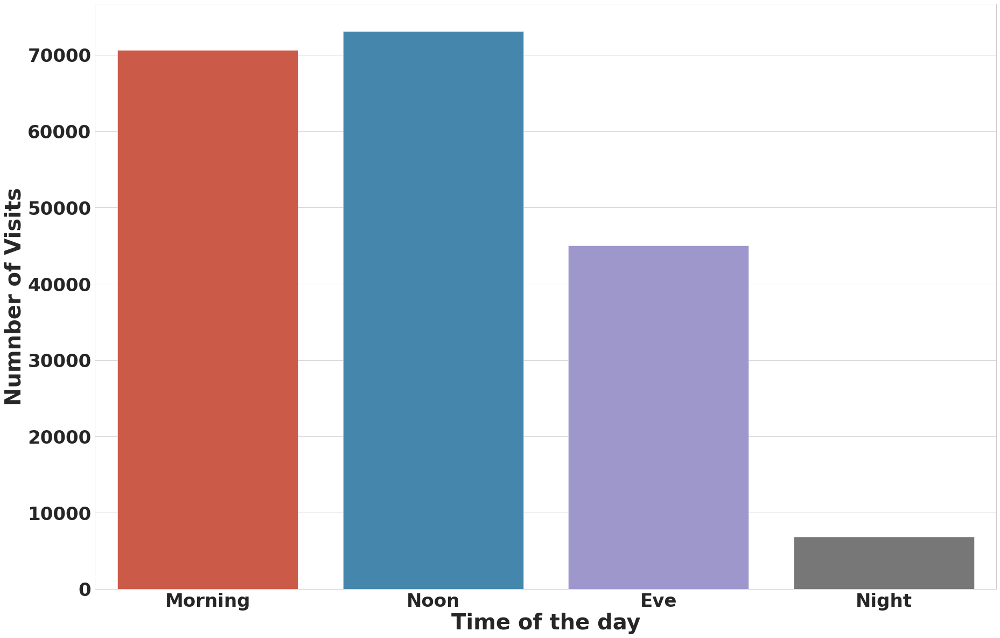

In [73]:
# Day's session wise summary
time_day = pd.read_sql_query("""SELECT session, COUNT(*) AS no_of_purchase, SUM(basket_spend) AS total_basket_spend, AVG(basket_spend) AS avg_basket_spend, SUM(basket_quantity) AS total_basket_quantity, AVG(basket_quantity) AS avg_basket_quantity, AVG(basket_category) AS avg_basket_category
                     FROM new_basket 
                    GROUP BY session""",con)
sns.set_style("whitegrid")

# Plotting barplot across time of the day
sns.barplot(x=time_day.session,y=time_day['no_of_purchase'],order=['Morning','Noon','Eve','Night'])

# Defining figure size
plt.rcParams['figure.figsize']=(30,20)

# Applying X and Y labels to the plot
plt.ylabel("Numnber of Visits",fontsize=40,fontweight='bold')
plt.xlabel("Time of the day",fontsize=40,fontweight='bold')

# Changing the characteristics of x and y ticks
plt.yticks(fontsize=34,fontweight='bold')
plt.xticks(fontsize=34,fontweight='bold')

time_day

,category,total_spent,total_quantity,Avg_Cost
0,BAKERY,114630.37,133725,0.857210
1,CASHPOINT,135991.75,11858,11.468355
2,CONFECTIONARY,172043.38,215839,0.797091
3,DAIRY,213908.05,224304,0.953652
4,DELI,41209.32,31798,1.295972
5,DISCOUNT_BAKERY,5444.51,5173,1.052486
6,DRINKS,186726.65,48167,3.876651
7,FROZEN,106398.06,69082,1.540171
8,FRUIT_VEG,208368.49,215955,0.964870
9,GROCERY_FOOD,180022.59,201777,0.892186


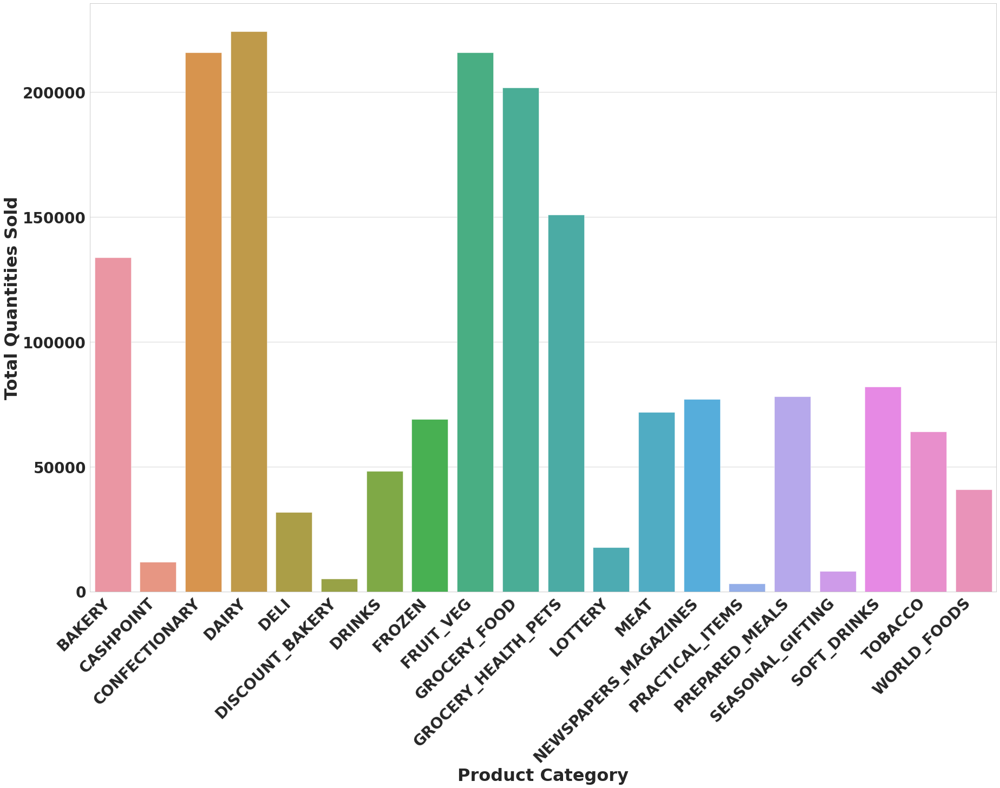

In [74]:
# To get the product category with highest quantities sold, highest revenue generated and highest avg price of the item
category_product=pd.read_sql_query("""SELECT category, SUM(spend) AS total_spent, SUM(quantity) AS total_quantity, SUM(spend)/SUM(quantity) AS Avg_Cost FROM lineitems GROUP BY category""",con)

# Plotting barplot across categories
sns.barplot(x=category_product.category,y=category_product['total_quantity'])

# Defining figure size
plt.rcParams['figure.figsize']=(42,20)

# Applying X and Y labels to the plot
plt.ylabel("Total Quantities Sold",fontsize=32,fontweight='bold')
plt.xlabel("Product Category",fontsize=32,fontweight='bold')

# Changing the characteristics of x and y ticks
plt.xticks(rotation=45,ha="right",fontsize=28,fontweight='bold')
plt.yticks(fontsize=28,fontweight='bold')

category_product

,day_of_week,no_of_purchase,total_spent,avg_basket_spend,total_basket_quantity,avg_basket_quantity,avg_basket_category
0,Friday,32552,440551.90,13.533789,329708,10.128656,8.451401
1,Monday,28338,297084.13,10.483596,226594,7.996118,6.674818
2,Saturday,29757,402545.85,13.527770,301700,10.138791,8.459287
3,Sunday,14730,155078.67,10.528084,114878,7.798914,6.546911
4,Thursday,31117,373637.24,12.007496,285011,9.159334,7.598901
5,Tuesday,29948,327596.01,10.938828,254819,8.508715,7.119541
6,Wednesday,29105,311745.01,10.711047,238456,8.192957,6.845009


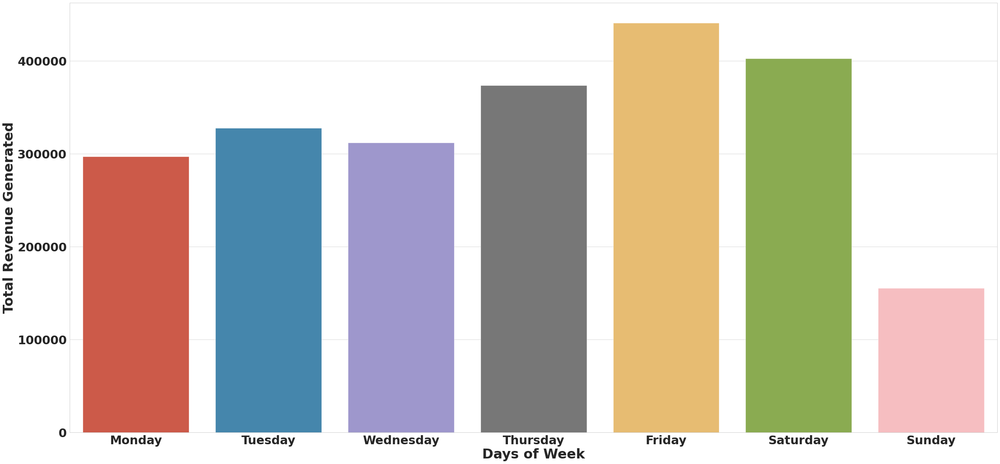

In [75]:
# Week's Day wise summary of the purchase
day_week = pd.read_sql_query("""SELECT day_of_week, COUNT(*) AS no_of_purchase, SUM(basket_spend) AS total_spent, AVG(basket_spend) AS avg_basket_spend, SUM(basket_quantity) AS total_basket_quantity, AVG(basket_quantity) AS avg_basket_quantity, AVG(basket_category) AS avg_basket_category
                     FROM new_basket 
                    GROUP BY day_of_week""",con)

# Plotting barplot across categories
sns.barplot(x=day_week.day_of_week,y=day_week['total_spent'],order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])

# Defining figure size
plt.rcParams['figure.figsize']=(30,20)

# Applying X and Y labels to the plot
plt.ylabel("Total Revenue Generated",fontsize=34,fontweight='bold')
plt.xlabel("Days of Week",fontsize=34,fontweight='bold')

# Changing the characteristics of x and y ticks
plt.xticks(fontsize=30,fontweight='bold')
plt.yticks(fontsize=30,fontweight='bold')

day_week

### **Individual Feature Analysis**
Plotting histograms and boxplots to understand distribution of each feature

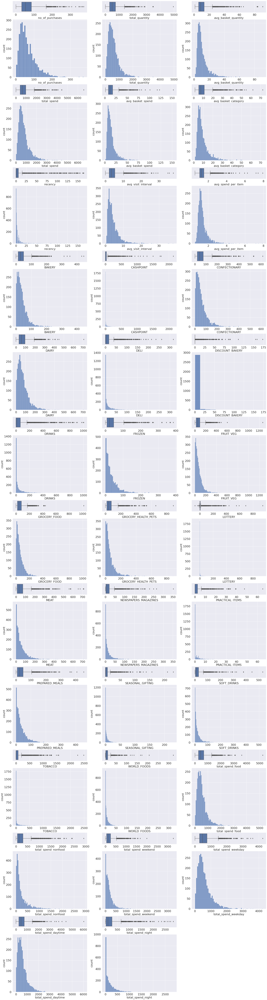

In [76]:
# Defining the overall figure size for all subplots
plt.rcParams['figure.figsize'] = (35,140)

# Setting up a grey background for the subplots
sns.set(style="darkgrid")

# Defining Ratio of boxplot to histogram
a = np.tile([1,5],12)

# Creating a figure and a set of subplots, the 'axes' stores an array of Axes objects
fig,axes = plt.subplots(ncols=3,nrows=24,gridspec_kw={'height_ratios':a})

# # Hiding the last 2 subplot because we have only 7 subplots to be plotted
axes[-1, -1].axis('off')
# axes[-1, -2].axis('off')
# axes[-2, -2].axis('off')
axes[-2, -1].axis('off')

# Storing axes objects in the list, in order to traverse using for loop
axes_list = []
for j in axes.flat:
  axes_list.append(j)

# Defining list1 to store the subplots index where we want to plot the box plots i.e 1st row, 3rd row, 5th row, etc
list1 = [0,1,2,6,7,8,12,13,14,18,19,20,24,25,26,30,31,32,36,37,38,42,43,44,48,49,50,54,55,56,60,61,62,66,67,68,72,73,74]

# Run for loop across the columns
for i in range(len(input.columns)):
  j = list1[i]
  # Plotting box plot in the odd no. of row for ith column of input
  sns.boxplot(x=input.iloc[:,i], ax=axes_list[j])
  axes_list[j].set_xlabel(input.columns[i],fontsize=22)
  axes_list[j].tick_params(axis='x', labelsize=22)
  # Plotting histogram plot in the even no. of row for ith column of input
  sns.histplot(data=input.iloc[:,i], ax=axes_list[j+3])
  axes_list[j+3].set_xlabel(input.columns[i],fontsize=22)
  axes_list[j+3].set_ylabel('count',fontsize=22)
  axes_list[j+3].tick_params(axis='x', labelsize=22)
  axes_list[j+3].tick_params(axis='y', labelsize=22)
  

Text(0.5, 0, 'Boxplots of product category variables')

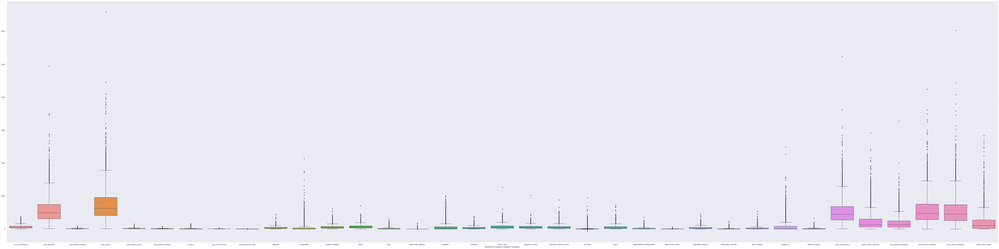

In [77]:
# Plotting the boxplots for all the features on the same plot which shows that all the features are right-skewed
fig, ax= plt.subplots(figsize=(120, 30))
boxplots= sns.boxplot(data = input)
plt.xlabel('Boxplots of product category variables')

### **Checking relationship between features**

To understand the correlation between various features

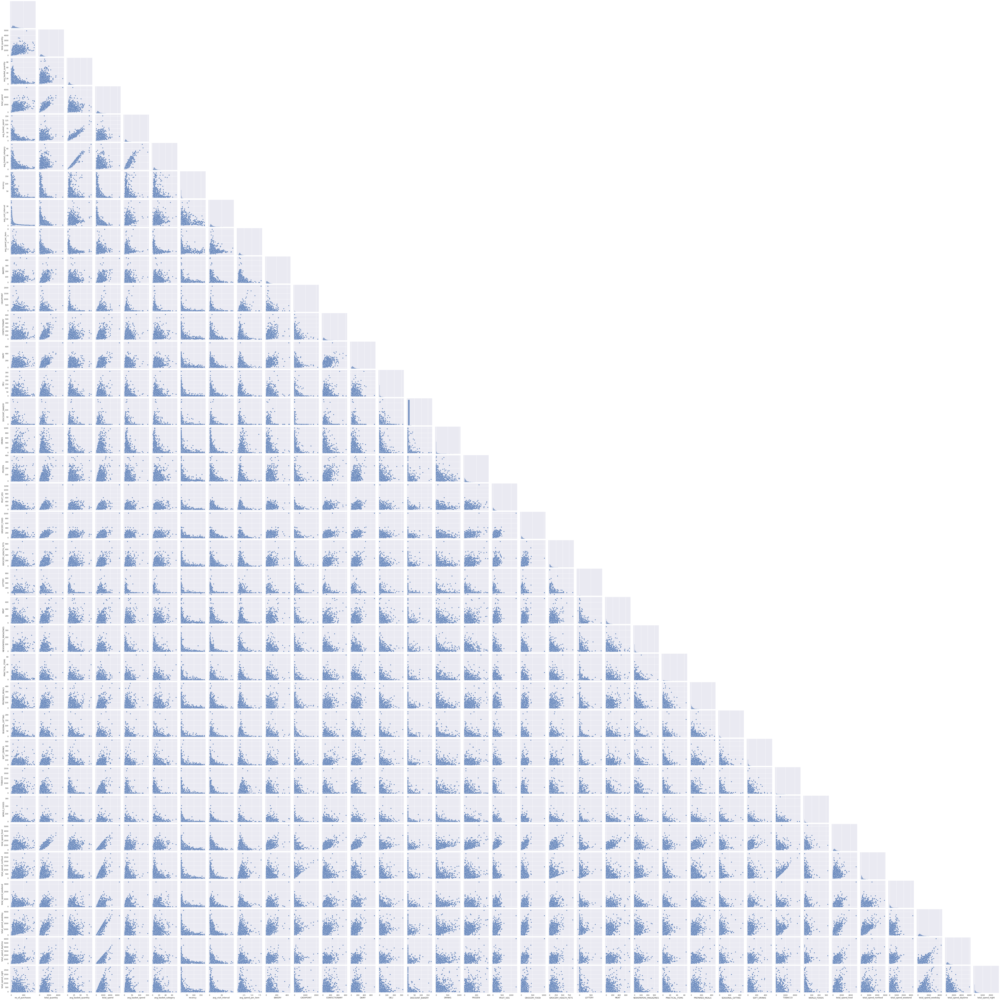

In [ ]:
# Plotting scatter plots between features to see the relationship between them
sns.pairplot(data=input,corner=True) 

Visualizing the correlation matrix on a heatmap:



<AxesSubplot:>

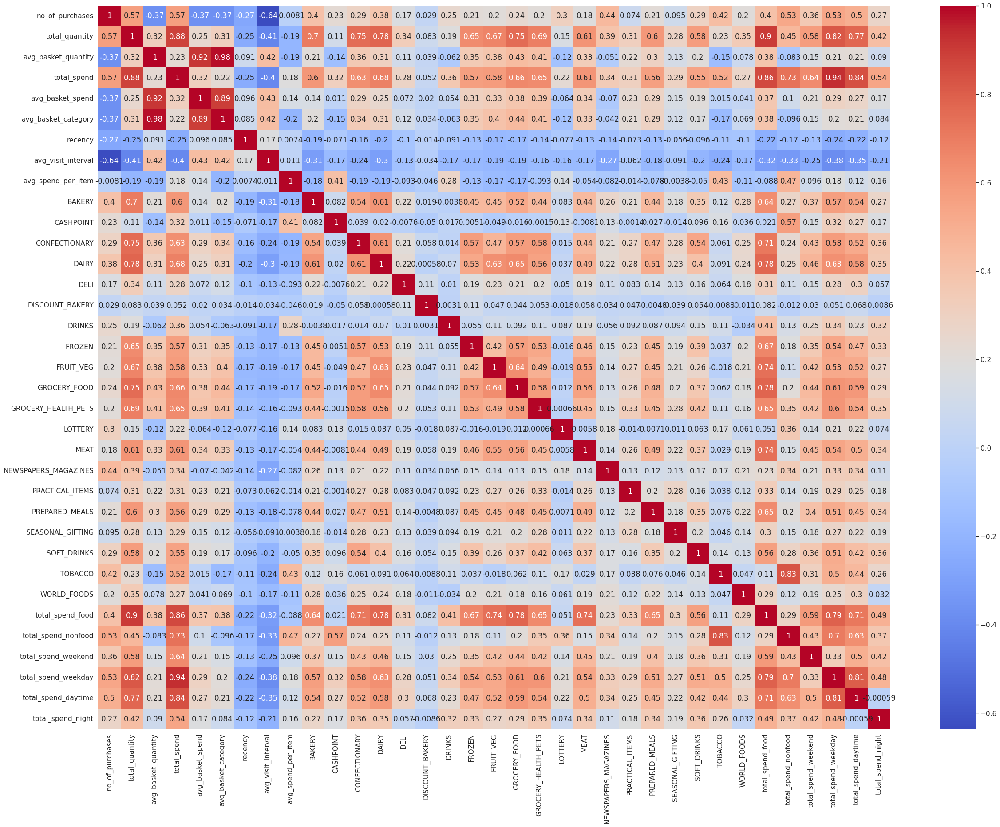

In [ ]:
# checking for linear relationship between variables using correlation coefficient

# Visualization the values of Pearson's correlation coefficient matrix on a heatmap
print('Visualizing the correlation matrix on a heatmap:\n')

# Defining the overall figure size for all subplots
plt.rcParams['figure.figsize']=(40,30)

# Scaling up font size
sns.set(font_scale=1.4)

# Genearting heatmap for correlation coefficient matrix
sns.heatmap(input.corr(),cmap='coolwarm',annot=True)

### **Apply Power transformation**

To make the skewed data distribution to more Gaussian-like

In [ ]:
# Applying Power Transformation to make data more Gaussian-like, using 'yeo-johnson method as it works with both positive and negative values
pt = PowerTransformer(method='yeo-johnson',standardize=True)
scaled = pd.DataFrame(pt.fit_transform(input),columns = input.columns)



### **Plotting histograms and boxplots to understand distribution of each feature**

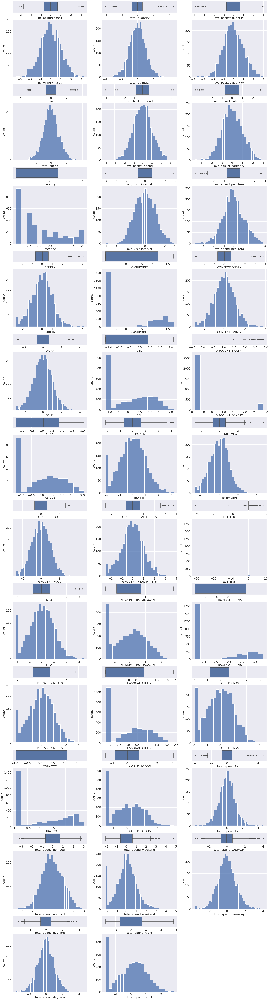

In [ ]:
# Defining the overall figure size for all subplots
plt.rcParams['figure.figsize'] = (35,140)

# Setting up a grey background for the subplots
sns.set(style="darkgrid")

# Defining Ratio of boxplot to histogram
a = np.tile([1,5],12)

# Creating a figure and a set of subplots, the 'axes' stores an array of Axes objects
fig,axes = plt.subplots(ncols=3,nrows=24,gridspec_kw={'height_ratios':a})

# # Hiding the last 2 subplot because we have only 7 subplots to be plotted
axes[-1, -1].axis('off')
axes[-2, -1].axis('off')

# Storing axes objects in the list, in order to traverse using for loop
axes_list = []
for j in axes.flat:
  axes_list.append(j)

# Defining list1 to store the subplots index where we want to plot the box plots i.e 1st row, 3rd row, 5th row, etc
list1 = [0,1,2,6,7,8,12,13,14,18,19,20,24,25,26,30,31,32,36,37,38,42,43,44,48,49,50,54,55,56,60,61,62,66,67,68,72,73,74]

# Run for loop across the columns
for i in range(len(scaled.columns)):
  j = list1[i]
  # Plotting box plot in the odd no. of row for ith column of input
  sns.boxplot(x=scaled.iloc[:,i], ax=axes_list[j])
  axes_list[j].set_xlabel(scaled.columns[i],fontsize=22)
  axes_list[j].tick_params(axis='x', labelsize=22)
  # Plotting histogram plot in the even no. of row for ith column of input
  sns.histplot(data=scaled.iloc[:,i], ax=axes_list[j+3])
  axes_list[j+3].set_xlabel(scaled.columns[i],fontsize=22)
  axes_list[j+3].set_ylabel('count',fontsize=22)
  axes_list[j+3].tick_params(axis='x', labelsize=22)
  axes_list[j+3].tick_params(axis='y', labelsize=22)
  

Text(0.5, 0, 'Boxplots of product category variables')

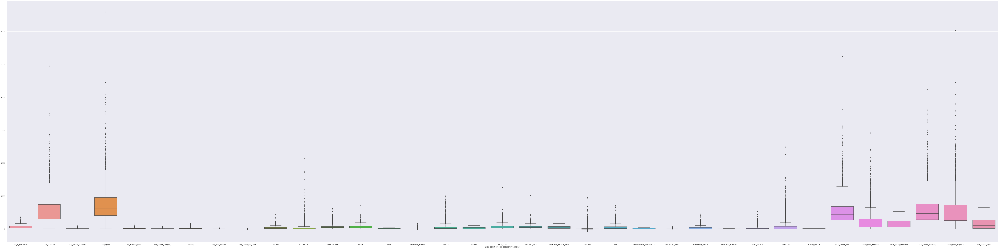

In [ ]:
# Plotting the boxplots for all the features on the same plot which shows that all the features are right-skewed
fig, ax= plt.subplots(figsize=(120, 30))
boxplots= sns.boxplot(data = input)
plt.xlabel('Boxplots of product category variables')

### **Apply Principal Component Analysis (PCA)**

In [ ]:
# Apply PCA by fitting the good data with the same number of dimensions as features
# scaled.columns = input.columns
pca = PCA()

pca.fit(scaled)

print("PCA explained variance: ", pca.explained_variance_ratio_)
print("Cumulative explained variance: ", pca.explained_variance_ratio_.cumsum())


PCA explained variance:  [3.32955404e-01 1.38607339e-01 6.92899911e-02 4.39684572e-02
 3.53313570e-02 3.41048589e-02 2.93445681e-02 2.69114698e-02
 2.48225892e-02 2.32872568e-02 2.21067064e-02 2.09550044e-02
 1.98910408e-02 1.93879256e-02 1.86196282e-02 1.68927855e-02
 1.54064313e-02 1.52621161e-02 1.42246129e-02 1.33135663e-02
 1.22764507e-02 1.08561505e-02 9.38128583e-03 8.72816682e-03
 7.66204778e-03 6.10416302e-03 2.91926603e-03 2.55137680e-03
 1.98145862e-03 1.33467690e-03 5.86106501e-04 5.11188618e-04
 1.91387438e-04 1.71534675e-04 6.16313027e-05]
Cumulative explained variance:  [0.3329554  0.47156274 0.54085273 0.58482119 0.62015255 0.65425741
 0.68360198 0.71051344 0.73533603 0.75862329 0.78073    0.801685
 0.82157604 0.84096397 0.8595836  0.87647638 0.89188281 0.90714493
 0.92136954 0.93468311 0.94695956 0.95781571 0.967197   0.97592516
 0.98358721 0.98969137 0.99261064 0.99516202 0.99714347 0.99847815
 0.99906426 0.99957545 0.99976683 0.99993837 1.        ]


### **Interpreting the principle components**

        no_of_purchases  total_quantity  avg_basket_quantity  total_spend  \
Dim 1          0.175239        0.282535             0.107926     0.273587   
Dim 2          0.326917        0.007836            -0.394388     0.085057   
Dim 3          0.192589        0.101710            -0.109520    -0.130894   
Dim 4          0.036037       -0.050203            -0.104067    -0.071939   
Dim 5          0.080255       -0.002276            -0.109126     0.094196   
Dim 6          0.001092        0.004536             0.003091     0.033847   
Dim 7          0.048434        0.029528            -0.030133    -0.002050   
Dim 8          0.018544        0.044483             0.044883     0.009714   
Dim 9          0.019043       -0.040709            -0.088574     0.007581   
Dim 10         0.031616       -0.006842            -0.048937     0.000361   
Dim 11        -0.020318        0.016947             0.046131     0.014680   
Dim 12         0.037768        0.047138             0.010314     0.011288   

<AxesSubplot:>

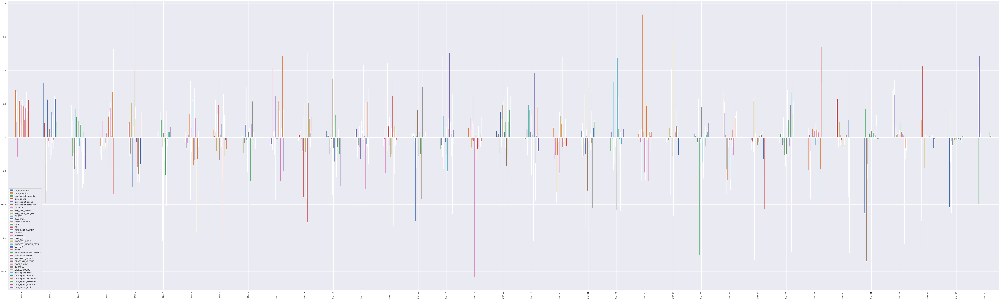

In [ ]:
# Creating name of columns as 'Dim 1', 'Dim 2', etc
y = list(range(1,scaled.shape[1]+1))

# Converting the int data type values of the array to string data type
y = list(map(str,y))

# Adding prefix 'Dim' to each element of the string array
ind = ['Dim ' + sub for sub in y]

#-- Print out PCA results and try to interpret what each factor means
pca_results= pd.DataFrame(data= pca.fit(scaled).components_, columns= scaled.columns, index=ind)
print(pca_results)

#-- Generate a PCA results bar plot 
pca_results.plot.bar(figsize=(100, 30))

### **Selecting the number of components after PCA**

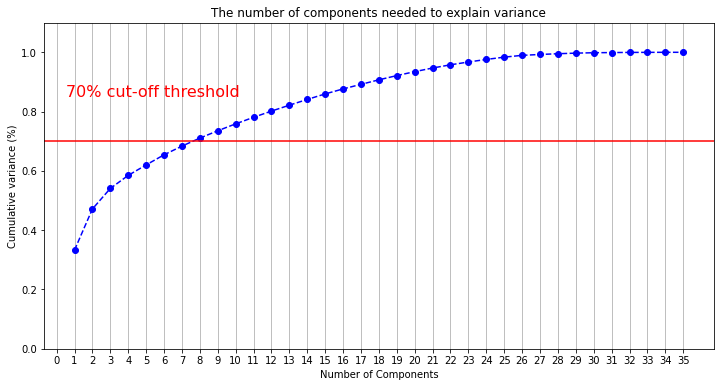

In [ ]:
# 1) Using cumulative explained variance for selecting PCA components

%matplotlib inline
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1,scaled.shape[1]+1, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, scaled.shape[1]+1, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.7, color='r', linestyle='-')
plt.text(0.5, 0.85, '70% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

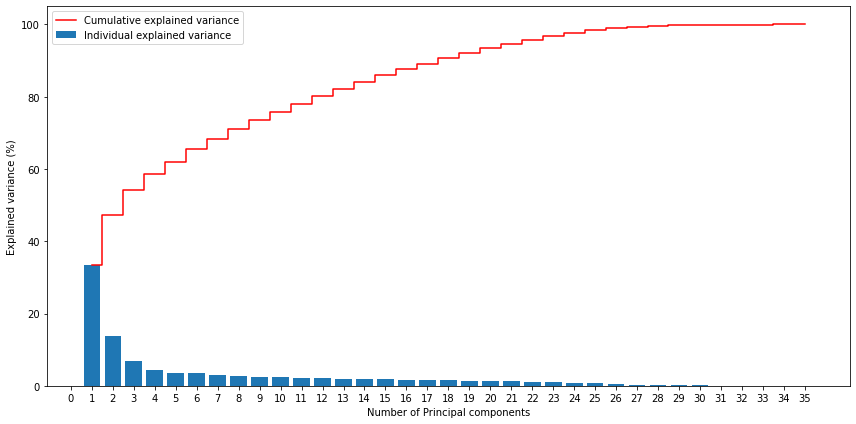

In [ ]:
# 2) Using explained variance percentage of individual components and the percentage of total variance captured by all principal components
exp_var = pca.explained_variance_ratio_ * 100
cum_exp_var = np.cumsum(exp_var)

plt.bar(range(1, scaled.shape[1]+1), exp_var, align='center',
        label='Individual explained variance')

plt.step(range(1, scaled.shape[1]+1), cum_exp_var, where='mid',
         label='Cumulative explained variance', color='red')

plt.ylabel('Explained variance (%)')
plt.xlabel('Number of Principal components')
plt.xticks(np.arange(0, scaled.shape[1]+1, step=1))
plt.legend(loc='best')
plt.tight_layout()

plt.savefig("Barplot.png")

Text(0.5, 1.0, 'Scree Plot')

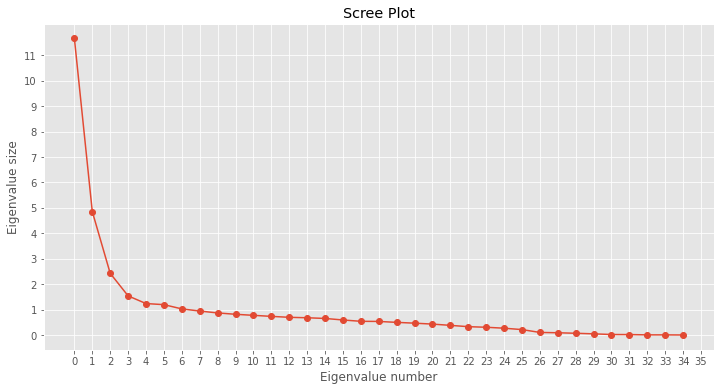

In [ ]:
# 3) Using Scree Plot for selecting the PCA components
plt.style.use("ggplot") 
plt.plot(pca.explained_variance_, marker='o')
plt.xticks(np.arange(0, scaled.shape[1]+1, step=1))
plt.yticks(np.arange(0,np.max(pca.explained_variance_),step=1))
plt.xlabel("Eigenvalue number")
plt.ylabel("Eigenvalue size")
plt.title("Scree Plot")

# 4) Using Kaiser's rule to select PCA components
# According to the Kaiser’s rule, it is recommended to keep all the components with eigenvalues greater than 1

### **View distribution of selected principle components**

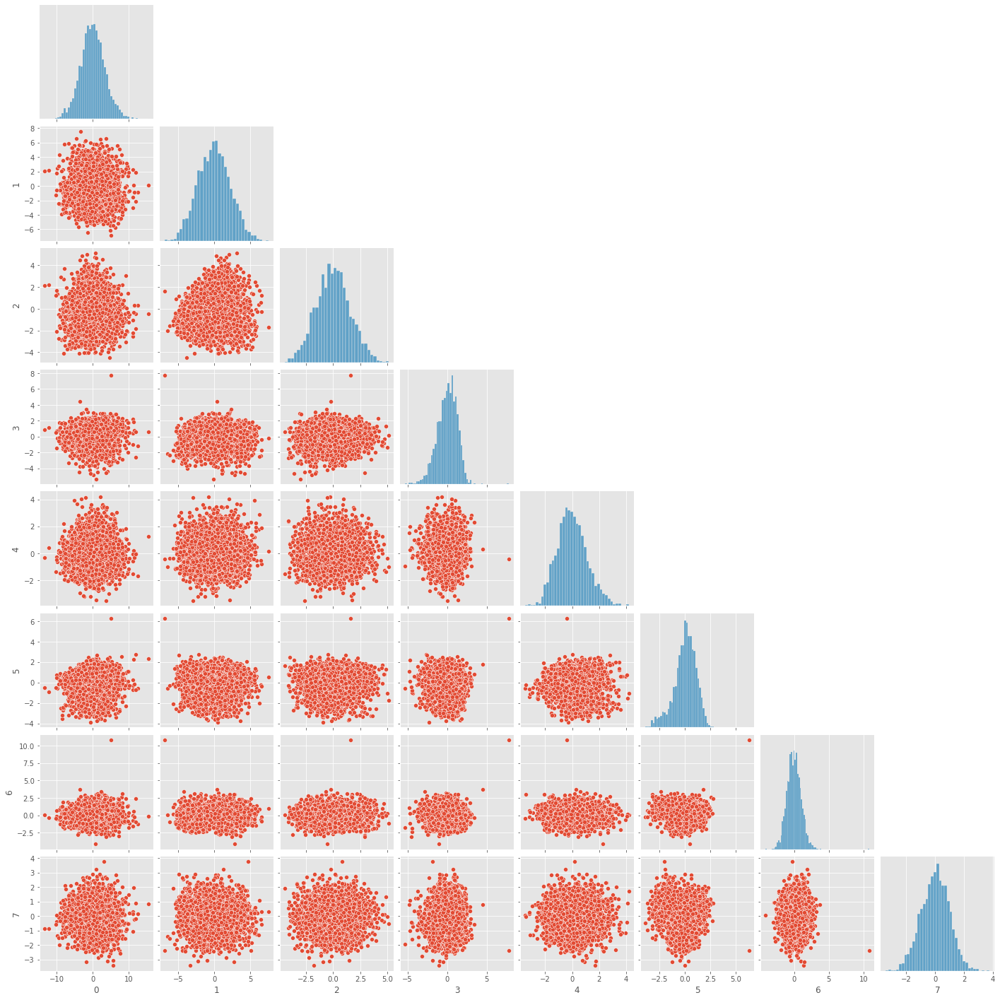

In [ ]:
# Apply PCA by fitting the good data with only two dimensions
# Instantiate
pca = PCA(n_components=8)
pca.fit(scaled)

# Transform the good data using the PCA fit above
reduced_data = pca.transform(scaled)

# Create a DataFrame for the reduced data
reduced_data = pd.DataFrame(reduced_data)
sns.pairplot(reduced_data,corner=True)
# scatter = pd.plotting.scatter_matrix(reduced_data, figsize = (30,20))

### **Selecting number of clusters for K-Means Clustering**

The possible range of clusters based on domain knowledge is: range(5, 8)
For n_clusters = 5. The average silhouette_score is : 0.15561923401303876)
For n_clusters = 6. The average silhouette_score is : 0.1497755069552785)
For n_clusters = 7. The average silhouette_score is : 0.14394165693940794)


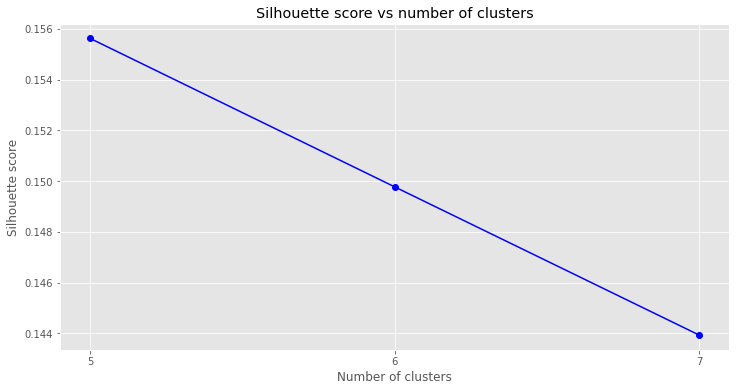

In [ ]:
# 1) Using Silhouette score
# Create range of clusters 

# Define range of cluster numbers
min_clusters = 5
max_clusters = 7
range_n_clusters = range(min_clusters, max_clusters+1)

# range_n_clusters = list(range(5, 8))
print("The possible range of clusters based on domain knowledge is:",range_n_clusters)

silhouette_scores = []

# Loop through clusters
for n in range_n_clusters:
    # Apply your clustering algorithm of choice to the reduced data 
    clusterer = KMeans(n_clusters = n,n_init=10,max_iter=1000,init="k-means++",random_state=123).fit(reduced_data)

    # Predict the cluster for each data point
    preds = clusterer.predict(reduced_data)

    # Find the cluster centers
    centers = clusterer.cluster_centers_

    # Calculate the mean silhouette coefficient for the number of clusters chosen
    score = silhouette_score(reduced_data, preds, metric='euclidean')
    # This gives a perspective into the density and separation of the formed clusters
    print("For n_clusters = {}. The average silhouette_score is : {})".format(n, score))
    silhouette_scores.append(score)

# Plot the results
plt.plot(range_n_clusters, silhouette_scores, 'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette score vs number of clusters')
plt.xticks(np.arange(min_clusters, max_clusters+1, 1))
plt.show()

For n_clusters = 5 The average silhouette_score is : 0.14394165693940794
For n_clusters = 6 The average silhouette_score is : 0.14394165693940794
For n_clusters = 7 The average silhouette_score is : 0.14394165693940794


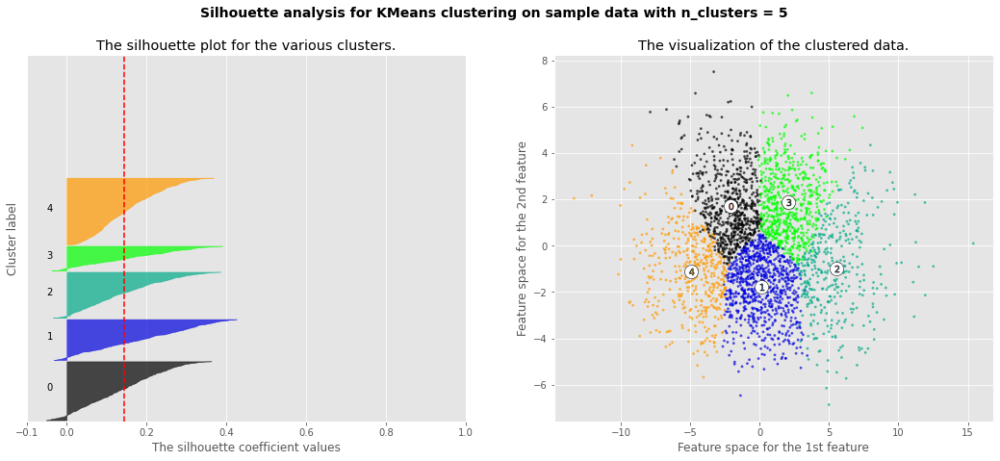

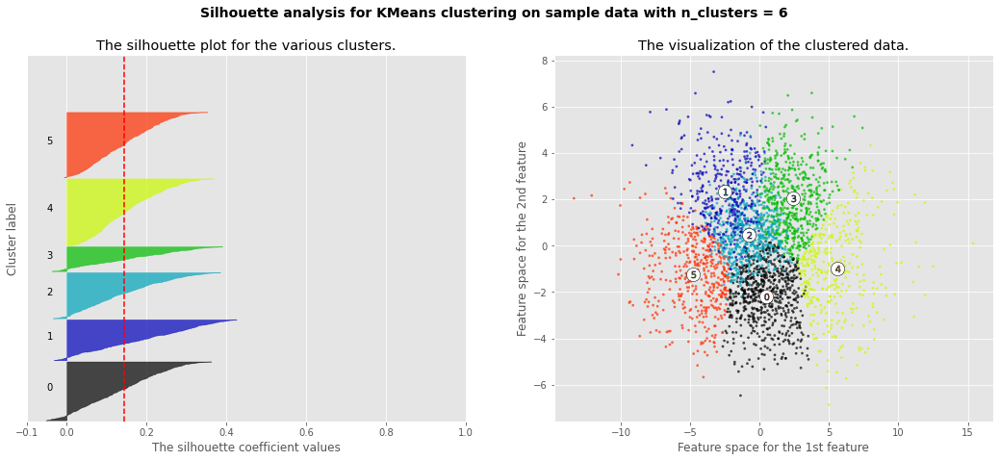

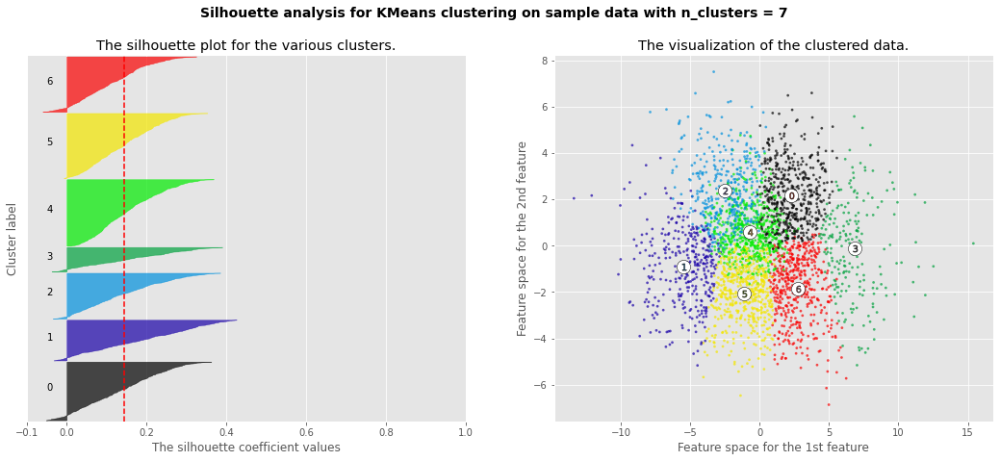

In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

range_n_clusters = [5, 6, 7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(reduced_data) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init=10,max_iter=1000,init='k-means++', random_state=123)
    cluster_labels = clusterer.fit_predict(reduced_data)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(reduced_data, preds)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(reduced_data, preds)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[preds == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        reduced_data.iloc[:, 0], reduced_data.iloc[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

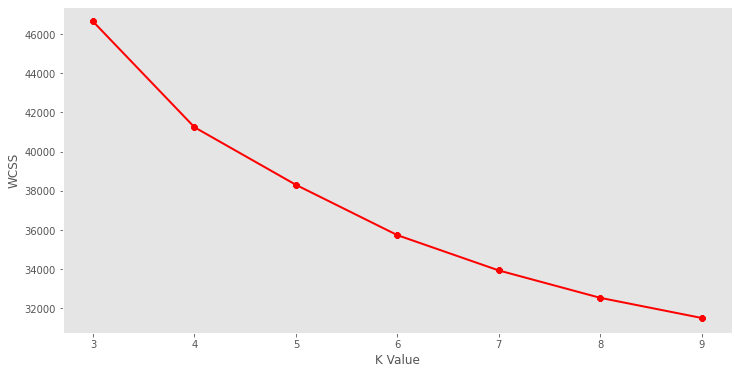

In [ ]:
# 2) Elbow method - Finding the elbow point on the graph of 'No. of clusters' vs 'WCSS' (Within-Cluster-Sum-of-Squares)
wcss = []
for k in range(3,10):
    kmeans = KMeans(n_clusters=k,n_init=10,max_iter=1000,init="k-means++",random_state=123)
    kmeans.fit(reduced_data)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))    
plt.grid()
plt.plot(range(3,10),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(3,10,1))
plt.ylabel("WCSS")
plt.show()

### **Applying K-means Clustering with selected number of Clusters**

In [ ]:
# Our final clustering solution
clusterer = KMeans(n_clusters=5,n_init=10,max_iter=1000,init="k-means++",random_state=123).fit(reduced_data)
preds = clusterer.predict(reduced_data)
centres = clusterer.cluster_centers_

# Put the predictions into a pandas dataframe format
assignments = pd.DataFrame(preds, columns = ['Cluster'])

# Put the predictions into a pandas dataframe format
plot_data = pd.concat([assignments, reduced_data], axis = 1)

### **Cluster Visualisation**

Text(0, 0.5, 'Dim 2')

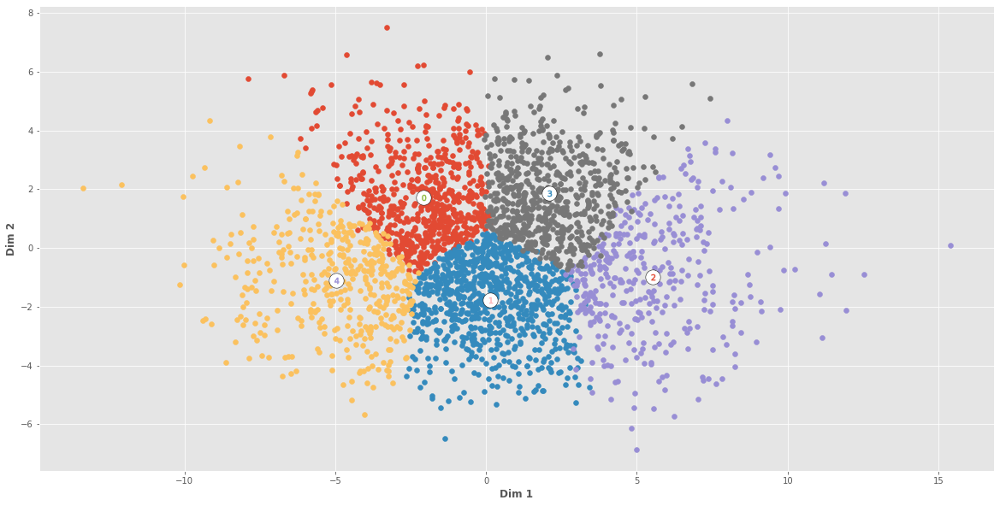

In [ ]:
# Viewing the clusters on 2-D scatter plot by plotting 3 principal components

# Applying color to the points based on assigned cluster
plt.rcParams['figure.figsize'] = (20,10)

for i, c in plot_data.groupby('Cluster'):  
    plt.scatter(c[0], c[1])
    
# Plottin the cluster centres
for i, c in enumerate(centres):
    plt.scatter(x = c[0], y = c[1], color = 'white', edgecolors = 'black', marker = 'o', s=300);
    plt.scatter(x = c[0], y = c[1], marker='${}$'.format(i), alpha = 1, s=50);

# Applying labels to the plots
plt.xlabel("Dim 1",fontweight='bold')
plt.ylabel("Dim 2",fontweight='bold')

Text(0.5, 0, 'Dim 3')

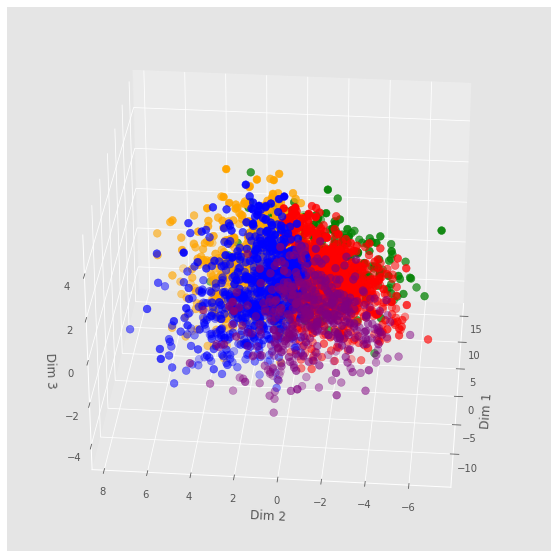

In [ ]:
# Viewing the clusters on 3-D scatter plot by plotting 3 principal components
plot_data.columns = ['Cluster','Dim 1','Dim 2','Dim 3','Dim 4','Dim 5','Dim 6','Dim 7','Dim 8']
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(plot_data['Dim 1'][plot_data.Cluster == 0], plot_data['Dim 2'][plot_data.Cluster == 0], plot_data['Dim 3'][plot_data.Cluster == 0], c='blue', s=60)
ax.scatter(plot_data['Dim 1'][plot_data.Cluster == 1], plot_data['Dim 2'][plot_data.Cluster == 1], plot_data['Dim 3'][plot_data.Cluster == 1], c='red', s=60)
ax.scatter(plot_data['Dim 1'][plot_data.Cluster == 2], plot_data['Dim 2'][plot_data.Cluster == 2], plot_data['Dim 3'][plot_data.Cluster == 2], c='green', s=60)
ax.scatter(plot_data['Dim 1'][plot_data.Cluster == 3], plot_data['Dim 2'][plot_data.Cluster == 3], plot_data['Dim 3'][plot_data.Cluster == 3], c='orange', s=60)
ax.scatter(plot_data['Dim 1'][plot_data.Cluster == 4], plot_data['Dim 2'][plot_data.Cluster == 4], plot_data['Dim 3'][plot_data.Cluster == 4], c='purple', s=60)
ax.view_init(30, 185)
plt.xlabel("Dim 1")
plt.ylabel("Dim 2")
ax.set_zlabel('Dim 3')

### **Creating Pofiles**

In [63]:
# Merging the assigned clusters to original dataset
final_assigments = pd.concat([assignments, final], axis = 1)

# Describing summary statistics for each cluster segment by running a loop
for c, d in final_assigments.groupby('Cluster'):  
    print("Cluster", c)
    display(d.describe())

Cluster 0


,Cluster,customer_number,no_of_purchases,total_quantity,avg_basket_quantity,total_spend,avg_basket_spend,avg_basket_category,recency,avg_visit_interval,avg_spend_per_item,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS,total_spend_food,total_spend_nonfood,total_spend_weekend,total_spend_weekday,total_spend_daytime,total_spend_night
count,670.0,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000,670.000000
mean,0.0,8739.226866,66.262687,348.592537,5.726976,516.422463,8.804608,4.780401,5.719403,3.070464,1.602697,24.030896,58.330866,27.825030,41.096985,7.474761,0.886716,55.985433,15.627851,34.432791,27.397388,26.047672,16.217015,23.895060,13.841060,0.858269,16.710731,3.430627,10.938269,105.729881,5.665164,291.967075,224.455388,120.357985,396.064478,374.588731,141.833731
std,0.0,4874.242994,29.392600,115.521899,1.895776,211.398470,4.809254,1.537440,15.293895,1.157972,0.812810,17.959287,137.924236,20.718972,29.013209,13.913418,4.863497,102.746348,17.233061,32.492649,23.947972,25.949797,52.389909,33.843092,23.475487,2.472593,19.020975,9.476113,14.631417,167.523157,9.256781,128.582340,221.802064,85.639563,201.796867,224.669384,153.749324
min,0.0,52.000000,23.000000,85.000000,1.370968,200.680000,2.070718,1.216216,0.000000,0.687970,0.558163,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-19.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000,1.770000,0.000000,34.250000,0.000000,0.000000
25%,0.0,4863.000000,46.000000,266.250000,4.414787,372.062500,5.902855,3.690934,0.000000,2.178571,1.082943,11.352500,0.000000,12.552500,21.410000,0.000000,0.000000,0.000000,4.492500,12.565000,11.742500,8.885000,0.000000,4.535000,1.502500,0.000000,4.952500,0.000000,2.190000,0.000000,0.300000,213.205000,70.830000,59.190000,267.072500,230.277500,17.617500
50%,0.0,8556.500000,58.000000,332.500000,5.643812,471.030000,7.697862,4.721077,1.000000,3.025758,1.385909,20.020000,8.500000,23.795000,35.480000,1.420000,0.000000,10.865000,10.700000,25.145000,21.105000,19.910000,0.000000,15.010000,6.640000,0.000000,11.725000,0.840000,5.780000,18.110000,2.525000,279.925000,142.745000,104.585000,353.815000,339.350000,96.195000
75%,0.0,13053.750000,81.000000,417.000000,6.902439,619.465000,10.647083,5.791424,4.000000,3.748670,1.844829,33.757500,60.000000,37.957500,52.205000,8.982500,0.000000,61.487500,21.037500,44.805000,36.020000,35.175000,9.075000,30.960000,16.502500,0.000000,22.237500,3.422500,14.162500,157.232500,7.135000,350.985000,317.112500,163.625000,478.662500,463.990000,208.800000
max,0.0,16303.000000,266.000000,839.000000,14.037037,2407.450000,57.320238,10.444444,123.000000,7.826087,7.919243,150.970000,2137.010000,132.120000,194.300000,145.600000,56.420000,749.320000,129.830000,254.370000,174.820000,285.570000,946.000000,407.270000,351.730000,32.200000,234.630000,137.890000,112.910000,1272.290000,88.040000,919.070000,2164.030000,480.060000,2407.450000,2404.460000,936.540000


Cluster 1


,Cluster,customer_number,no_of_purchases,total_quantity,avg_basket_quantity,total_spend,avg_basket_spend,avg_basket_category,recency,avg_visit_interval,avg_spend_per_item,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS,total_spend_food,total_spend_nonfood,total_spend_weekend,total_spend_weekday,total_spend_daytime,total_spend_night
count,853.0,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000
mean,1.0,7908.080891,40.015240,530.817116,15.608521,624.736624,18.968482,12.857111,6.508792,5.321634,1.213167,34.607878,7.705358,55.223623,71.275346,14.618570,2.361161,40.540832,38.203400,75.303095,66.503634,59.040821,3.493154,56.250832,9.635838,1.847984,36.721184,5.233869,18.683306,19.746717,7.740023,518.032884,106.703740,150.783470,473.953154,483.679965,141.056659
std,0.0,4937.771244,18.022313,171.136664,8.297728,192.371102,11.080222,6.590723,14.584672,2.892106,0.286515,25.103318,28.750646,36.053913,38.241057,22.603374,11.102571,72.658321,32.144222,47.619427,39.691713,44.194185,16.819501,46.982957,13.751168,3.526252,34.353961,10.742685,23.599338,67.173585,11.304362,169.402056,93.032489,159.979219,223.006097,233.193774,170.578390
min,1.0,14.000000,4.000000,220.000000,5.506494,300.240000,5.365510,4.674699,0.000000,1.324324,0.613454,0.000000,0.000000,1.910000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.530000,0.000000,-15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,213.500000,1.680000,0.000000,0.000000,15.860000,0.000000
25%,1.0,2982.000000,27.000000,403.000000,10.205128,477.410000,11.854412,8.571429,1.000000,3.428571,1.033973,19.180000,0.000000,29.740000,45.060000,0.000000,0.000000,0.000000,15.440000,41.170000,35.990000,28.520000,0.000000,23.040000,0.450000,0.000000,13.400000,0.000000,5.640000,0.000000,0.990000,393.050000,50.720000,39.560000,325.740000,329.050000,4.870000
50%,1.0,8247.000000,37.000000,504.000000,13.148148,586.450000,15.676842,10.920000,2.000000,4.710526,1.178137,29.430000,0.000000,46.580000,65.040000,5.000000,0.000000,10.210000,30.920000,65.710000,59.370000,47.380000,0.000000,46.260000,4.940000,0.000000,27.910000,1.690000,13.120000,0.000000,3.840000,483.250000,82.820000,109.130000,445.230000,454.920000,78.860000
75%,1.0,12523.000000,51.000000,629.000000,18.120000,755.160000,23.236000,15.000000,6.000000,6.444444,1.336224,44.670000,0.000000,71.900000,89.330000,19.360000,0.000000,48.520000,50.950000,99.140000,89.010000,77.230000,0.000000,75.080000,12.620000,2.450000,50.290000,5.920000,24.920000,4.110000,9.990000,625.800000,129.980000,201.760000,598.740000,609.360000,227.930000
max,1.0,16281.000000,118.000000,1165.000000,83.250000,1450.000000,100.482500,55.000000,136.000000,35.750000,2.876301,335.010000,378.940000,282.430000,294.620000,189.270000,173.060000,554.170000,250.480000,327.570000,276.210000,292.210000,365.000000,344.260000,104.200000,34.080000,234.240000,119.120000,445.950000,722.450000,125.640000,1143.190000,988.650000,1099.130000,1450.000000,1450.000000,1191.550000


Cluster 2


,Cluster,customer_number,no_of_purchases,total_quantity,avg_basket_quantity,total_spend,avg_basket_spend,avg_basket_category,recency,avg_visit_interval,avg_spend_per_item,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS,total_spend_food,total_spend_nonfood,total_spend_weekend,total_spend_weekday,total_spend_daytime,total_spend_night
count,375.0,375.000000,375.000000,375.000000,375.000000,375.00000,375.000000,375.000000,375.00000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.00000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.00000
mean,2.0,7216.037333,86.682667,1310.690667,19.664676,1691.75272,25.412180,15.913610,2.85600,2.872135,1.310769,84.885040,46.870773,143.161440,160.001920,28.487440,3.112933,110.584747,92.155653,169.90008,149.588880,168.565147,16.109600,149.268613,29.463147,5.568213,88.102987,15.898667,64.487040,148.353760,17.186640,1260.923413,430.829307,416.142613,1275.610107,1180.693200,511.05952
std,0.0,3852.909136,53.391432,490.519914,12.716537,693.35561,17.306949,9.968860,6.24162,1.807133,0.306493,55.882966,106.125968,84.651766,75.191779,42.819994,14.715405,174.858537,66.842573,113.58360,85.133977,111.169720,54.974483,115.802878,34.279873,7.557765,64.653266,23.542915,65.048916,289.075215,20.420289,496.996193,377.330937,369.832858,583.724361,700.565997,542.69475
min,2.0,67.000000,12.000000,606.000000,5.671480,855.66000,6.807119,4.974729,0.00000,0.516949,0.759228,6.520000,0.000000,19.470000,31.390000,0.000000,0.000000,0.000000,2.880000,13.02000,29.410000,2.160000,-74.000000,0.000000,0.000000,0.000000,0.490000,0.000000,0.000000,0.000000,0.000000,601.620000,30.190000,0.000000,0.000000,6.340000,0.00000
25%,2.0,3661.500000,50.000000,969.000000,11.432152,1226.76000,14.857089,9.255490,0.00000,1.626786,1.102501,49.390000,0.000000,86.385000,109.920000,0.890000,0.000000,4.940000,43.950000,94.76500,95.515000,91.490000,0.000000,72.185000,6.625000,0.000000,44.315000,2.760000,21.235000,0.000000,3.715000,936.560000,179.960000,155.645000,911.845000,729.925000,70.37000
50%,2.0,7587.000000,73.000000,1206.000000,16.051282,1511.49000,20.614048,13.028986,1.00000,2.472973,1.257201,71.680000,0.000000,121.000000,141.810000,8.450000,0.000000,35.300000,75.450000,145.74000,131.130000,141.590000,0.000000,120.250000,17.250000,3.220000,73.140000,10.060000,45.440000,5.820000,10.970000,1150.920000,311.250000,328.880000,1188.500000,1102.340000,368.85000
75%,2.0,10551.000000,109.500000,1544.000000,23.107692,1982.27500,29.608778,18.969231,3.00000,3.568627,1.450935,102.705000,40.000000,176.580000,197.505000,38.600000,0.000000,124.515000,122.175000,213.49000,193.430000,217.625000,8.000000,190.760000,40.465000,7.450000,116.995000,19.345000,89.870000,158.960000,22.625000,1450.105000,549.015000,566.070000,1536.280000,1505.195000,774.66500
max,2.0,16117.000000,354.000000,4949.000000,90.750000,6588.65000,152.621667,72.416667,56.00000,13.916667,2.703703,444.370000,790.000000,614.370000,708.040000,316.190000,154.790000,993.050000,385.800000,1262.97000,1017.070000,884.450000,690.000000,713.280000,249.700000,65.060000,454.290000,229.440000,529.650000,2488.940000,172.620000,5240.560000,2915.130000,3275.640000,4240.760000,6030.150000,2839.54000


Cluster 3


,Cluster,customer_number,no_of_purchases,total_quantity,avg_basket_quantity,total_spend,avg_basket_spend,avg_basket_category,recency,avg_visit_interval,avg_spend_per_item,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS,total_spend_food,total_spend_nonfood,total_spend_weekend,total_spend_weekday,total_spend_daytime,total_spend_night
count,660.0,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000
mean,3.0,7399.484848,114.630303,753.807576,7.159668,1054.113758,10.176762,6.080286,2.254545,1.806988,1.447376,49.047909,101.231136,66.650652,84.967697,16.611712,1.964939,95.594924,36.613803,73.124379,61.673833,65.990742,32.524621,55.768182,29.201045,2.210667,39.400333,6.820288,29.881909,193.470833,11.364152,622.664424,431.449333,250.635636,803.478121,771.332470,282.781288
std,0.0,3906.927851,48.693333,226.067055,2.219035,402.310522,4.377467,1.862228,8.831352,0.664138,0.527262,31.683407,189.444069,41.975678,43.992616,27.566451,9.341873,164.232288,30.117061,49.205577,37.188917,51.042576,72.066364,45.208408,34.681986,4.160010,32.194951,11.151133,32.032988,281.116652,20.219344,216.518285,372.740897,152.275478,345.070697,398.738176,308.514587
min,3.0,119.000000,38.000000,358.000000,2.729107,468.200000,2.662363,2.456067,0.000000,0.489305,0.589959,2.250000,0.000000,2.850000,9.180000,0.000000,0.000000,0.000000,0.000000,0.000000,1.330000,2.540000,-10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,207.130000,28.320000,0.000000,112.630000,0.000000,0.000000
25%,3.0,4431.250000,81.750000,600.750000,5.587815,771.270000,7.224322,4.742544,0.000000,1.288732,1.093035,28.507500,0.000000,39.205000,54.730000,0.000000,0.000000,1.757500,14.912500,38.007500,35.107500,30.385000,0.000000,21.907500,6.817500,0.000000,16.727500,0.390000,8.185000,0.150000,2.017500,473.510000,158.705000,148.677500,555.417500,504.665000,57.600000
50%,3.0,7139.500000,104.000000,712.500000,6.960697,950.405000,9.315447,5.841989,0.000000,1.733333,1.316492,42.435000,21.000000,58.990000,76.095000,5.670000,0.000000,19.555000,29.690000,64.510000,53.740000,54.505000,3.000000,46.110000,17.955000,0.000000,32.310000,3.410000,21.645000,56.755000,5.960000,578.365000,302.855000,220.990000,728.210000,689.830000,193.140000
75%,3.0,10365.500000,138.250000,872.250000,8.526721,1264.110000,12.432939,7.188474,2.000000,2.183491,1.668357,62.612500,130.000000,84.582500,106.612500,20.420000,0.000000,109.265000,50.365000,97.810000,79.930000,85.627500,30.000000,78.347500,37.170000,3.075000,52.710000,8.462500,38.512500,287.150000,14.847500,730.570000,594.730000,321.022500,965.715000,943.525000,394.012500
max,3.0,16292.000000,374.000000,2080.000000,15.384615,3050.780000,31.204070,12.470588,147.000000,4.512821,4.720067,228.850000,1751.900000,391.780000,353.510000,235.150000,88.890000,1005.330000,227.640000,307.290000,262.860000,512.640000,591.000000,263.810000,265.100000,47.540000,362.960000,127.650000,244.060000,2264.310000,321.490000,1564.100000,2415.720000,1421.390000,2600.610000,2715.660000,2493.140000


Cluster 4


,Cluster,customer_number,no_of_purchases,total_quantity,avg_basket_quantity,total_spend,avg_basket_spend,avg_basket_category,recency,avg_visit_interval,avg_spend_per_item,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS,total_spend_food,total_spend_nonfood,total_spend_weekend,total_spend_weekday,total_spend_daytime,total_spend_night
count,442.0,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000
mean,4.0,9268.380090,20.036199,171.493213,10.337882,224.463959,13.751094,8.596042,28.101810,9.114740,1.423280,10.872489,13.457715,19.502014,21.483710,4.717353,0.841923,22.789932,10.444389,20.566425,18.412172,18.438959,2.589140,16.849955,4.855023,0.792240,11.039615,2.612127,6.198756,15.014615,2.985407,166.704140,57.759819,60.844729,163.619231,153.705724,70.758235
std,0.0,5228.846568,9.993583,76.256080,6.603087,94.750573,8.670304,5.419403,39.712585,5.251590,0.627127,9.736555,39.182025,16.207072,14.754933,10.291188,3.867368,41.932251,11.555953,18.255284,15.511430,20.315005,8.575072,18.565409,10.682098,2.250728,11.339734,6.770696,8.279671,44.595768,4.407374,80.845635,66.634622,62.491408,89.475166,97.617316,76.997027
min,4.0,68.000000,1.000000,6.000000,1.200000,7.280000,1.456000,1.200000,0.000000,0.000000,0.596139,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-36.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.480000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.0,3969.250000,12.000000,112.000000,6.301087,156.362500,8.123370,5.229167,3.000000,5.770578,1.073319,4.505000,0.000000,8.490000,10.190000,0.000000,0.000000,0.000000,2.022500,7.250000,6.942500,4.902500,0.000000,3.595000,0.000000,0.000000,2.190000,0.000000,0.897500,0.000000,0.000000,109.582500,17.422500,13.947500,104.447500,78.197500,7.917500
50%,4.0,11534.000000,20.000000,168.000000,8.566239,225.415000,11.708839,7.140741,10.000000,7.697826,1.252840,8.580000,0.000000,15.090000,19.425000,0.300000,0.000000,3.565000,7.260000,15.260000,13.725000,12.700000,0.000000,11.555000,2.100000,0.000000,7.410000,0.000000,3.455000,0.000000,1.060000,163.140000,35.990000,41.760000,149.720000,142.955000,46.945000
75%,4.0,13821.250000,27.000000,227.750000,12.569196,281.890000,16.400662,10.044118,35.750000,10.968750,1.553406,14.695000,0.000000,27.755000,29.425000,4.357500,0.000000,26.310000,13.717500,29.982500,24.665000,24.420000,0.000000,23.070000,5.830000,0.000000,16.942500,2.710000,7.557500,9.340000,4.060000,219.062500,71.377500,91.677500,220.027500,211.490000,108.465000
max,4.0,16316.000000,58.000000,443.000000,55.000000,689.800000,73.750000,51.000000,164.000000,38.000000,7.414222,72.700000,320.000000,119.200000,93.830000,96.760000,47.330000,280.530000,76.410000,117.740000,90.900000,143.960000,64.000000,127.310000,153.620000,20.570000,75.340000,82.790000,50.640000,583.420000,28.610000,428.540000,587.600000,350.940000,689.800000,689.800000,388.200000


### Distinguishing features for each clusters

In [65]:
# Cluster 0
final_assigments[['avg_basket_quantity','avg_basket_spend','avg_basket_category','avg_spend_per_item','CASHPOINT','TOBACCO','total_spend_nonfood']][final_assigments['Cluster']==0].describe().T


,count,mean,std,min,25%,50%,75%,max
avg_basket_quantity,670.0,5.726976,1.895776,1.370968,4.414787,5.643812,6.902439,14.037037
avg_basket_spend,670.0,8.804608,4.809254,2.070718,5.902855,7.697862,10.647083,57.320238
avg_basket_category,670.0,4.780401,1.537440,1.216216,3.690934,4.721077,5.791424,10.444444
avg_spend_per_item,670.0,1.602697,0.812810,0.558163,1.082943,1.385909,1.844829,7.919243
CASHPOINT,670.0,58.330866,137.924236,0.000000,0.000000,8.500000,60.000000,2137.010000
TOBACCO,670.0,105.729881,167.523157,0.000000,0.000000,18.110000,157.232500,1272.290000
total_spend_nonfood,670.0,224.455388,221.802064,1.770000,70.830000,142.745000,317.112500,2164.030000


In [66]:
# Cluster 1
final_assigments[['avg_basket_quantity','avg_basket_spend','avg_basket_category','avg_spend_per_item','avg_visit_interval','total_spend_food','total_spend_daytime','total_spend_weekday']][final_assigments['Cluster']==1].describe().T


,count,mean,std,min,25%,50%,75%,max
avg_basket_quantity,853.0,15.608521,8.297728,5.506494,10.205128,13.148148,18.120000,83.250000
avg_basket_spend,853.0,18.968482,11.080222,5.365510,11.854412,15.676842,23.236000,100.482500
avg_basket_category,853.0,12.857111,6.590723,4.674699,8.571429,10.920000,15.000000,55.000000
avg_spend_per_item,853.0,1.213167,0.286515,0.613454,1.033973,1.178137,1.336224,2.876301
avg_visit_interval,853.0,5.321634,2.892106,1.324324,3.428571,4.710526,6.444444,35.750000
total_spend_food,853.0,518.032884,169.402056,213.500000,393.050000,483.250000,625.800000,1143.190000
total_spend_daytime,853.0,483.679965,233.193774,15.860000,329.050000,454.920000,609.360000,1450.000000
total_spend_weekday,853.0,473.953154,223.006097,0.000000,325.740000,445.230000,598.740000,1450.000000


In [67]:
# Cluster 2
final_assigments[['no_of_purchases','total_quantity','avg_basket_quantity','total_spend','avg_basket_spend','avg_basket_category','BAKERY','CONFECTIONARY','FRUIT_VEG','MEAT','PRACTICAL_ITEMS']][final_assigments['Cluster']==2].describe().T


,count,mean,std,min,25%,50%,75%,max
no_of_purchases,375.0,86.682667,53.391432,12.000000,50.000000,73.000000,109.500000,354.000000
total_quantity,375.0,1310.690667,490.519914,606.000000,969.000000,1206.000000,1544.000000,4949.000000
avg_basket_quantity,375.0,19.664676,12.716537,5.671480,11.432152,16.051282,23.107692,90.750000
total_spend,375.0,1691.752720,693.355610,855.660000,1226.760000,1511.490000,1982.275000,6588.650000
avg_basket_spend,375.0,25.412180,17.306949,6.807119,14.857089,20.614048,29.608778,152.621667
avg_basket_category,375.0,15.913610,9.968860,4.974729,9.255490,13.028986,18.969231,72.416667
BAKERY,375.0,84.885040,55.882966,6.520000,49.390000,71.680000,102.705000,444.370000
CONFECTIONARY,375.0,143.161440,84.651766,19.470000,86.385000,121.000000,176.580000,614.370000
FRUIT_VEG,375.0,169.900080,113.583600,13.020000,94.765000,145.740000,213.490000,1262.970000
MEAT,375.0,149.268613,115.802878,0.000000,72.185000,120.250000,190.760000,713.280000


In [68]:
# Cluster 3
final_assigments[['no_of_purchases','total_quantity','avg_basket_quantity','avg_visit_interval','CASHPOINT','DRINKS','LOTTERY','NEWSPAPERS_MAGAZINES','TOBACCO','total_spend_nonfood','total_spend_weekend']][final_assigments['Cluster']==3].describe().T

,count,mean,std,min,25%,50%,75%,max
no_of_purchases,660.0,114.630303,48.693333,38.000000,81.750000,104.000000,138.250000,374.000000
total_quantity,660.0,753.807576,226.067055,358.000000,600.750000,712.500000,872.250000,2080.000000
avg_basket_quantity,660.0,7.159668,2.219035,2.729107,5.587815,6.960697,8.526721,15.384615
avg_visit_interval,660.0,1.806988,0.664138,0.489305,1.288732,1.733333,2.183491,4.512821
CASHPOINT,660.0,101.231136,189.444069,0.000000,0.000000,21.000000,130.000000,1751.900000
DRINKS,660.0,95.594924,164.232288,0.000000,1.757500,19.555000,109.265000,1005.330000
LOTTERY,660.0,32.524621,72.066364,-10.000000,0.000000,3.000000,30.000000,591.000000
NEWSPAPERS_MAGAZINES,660.0,29.201045,34.681986,0.000000,6.817500,17.955000,37.170000,265.100000
TOBACCO,660.0,193.470833,281.116652,0.000000,0.150000,56.755000,287.150000,2264.310000
total_spend_nonfood,660.0,431.449333,372.740897,28.320000,158.705000,302.855000,594.730000,2415.720000


In [69]:
# Cluster 4
final_assigments[['no_of_purchases','total_quantity','total_spend','avg_visit_interval','recency','DRINKS','SOFT_DRINKS']][final_assigments['Cluster']==4].describe().T

,count,mean,std,min,25%,50%,75%,max
no_of_purchases,442.0,20.036199,9.993583,1.00,12.000000,20.000000,27.00000,58.00
total_quantity,442.0,171.493213,76.256080,6.00,112.000000,168.000000,227.75000,443.00
total_spend,442.0,224.463959,94.750573,7.28,156.362500,225.415000,281.89000,689.80
avg_visit_interval,442.0,9.114740,5.251590,0.00,5.770578,7.697826,10.96875,38.00
recency,442.0,28.101810,39.712585,0.00,3.000000,10.000000,35.75000,164.00
DRINKS,442.0,22.789932,41.932251,0.00,0.000000,3.565000,26.31000,280.53
SOFT_DRINKS,442.0,6.198756,8.279671,0.00,0.897500,3.455000,7.55750,50.64


### **Cluster Interpretation**

In [78]:
# 1) Interpreting the clusters using cluster centres

# Recovering Segment Archtypes in the original variables

# Apply Inverse transform for PCA and obtain the centres
pt_centres = pca.inverse_transform(centres)

# Apply Inverse transform for Power Transformation and obtain the centres
true_centres = pt.inverse_transform(pt_centres)

# Displaying the true centres of the clusters
segments = ['Segment {}'.format(i) for i in range(0, len(centres))]
true_centres = pd.DataFrame(np.round(true_centres), columns = input.columns)
true_centres.index = segments
print(true_centres)

           no_of_purchases  total_quantity  avg_basket_quantity  total_spend  \
Segment 0             63.0           329.0                  5.0        476.0   
Segment 1             36.0           509.0                 14.0        593.0   
Segment 2             79.0          1242.0                 17.0       1606.0   
Segment 3            106.0           742.0                  7.0       1017.0   
Segment 4             18.0           159.0                  9.0        214.0   

           avg_basket_spend  avg_basket_category  recency  avg_visit_interval  \
Segment 0               8.0                  5.0      1.0                 3.0   
Segment 1              16.0                 11.0      2.0                 5.0   
Segment 2              21.0                 14.0      1.0                 2.0   
Segment 3               9.0                  6.0      1.0                 2.0   
Segment 4              12.0                  7.0      6.0                 8.0   

           avg_spend_per_item  B

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but PowerTransformer was fitted with feature names
  warnings.warn(


In [79]:
# 2) Interpretation using Median values for all the features
#Finding statistical summary and grouping by Cluster for easy interpretation

#
final_assigments_overall = final_assigments.describe().T
final_assigments_overall['Overall Dataset'] = final_assigments_overall[['mean']]
final_assigments_overall = final_assigments_overall[['Overall Dataset']]


final_cluster_summary = final_assigments.groupby('Cluster').describe().T.reset_index()
final_cluster_summary = final_cluster_summary.rename(columns={'level_0':'column','level_1':'metric'})

final_cluster_summary = final_cluster_summary[final_cluster_summary['metric']=='50%']
final_cluster_summary = final_cluster_summary.set_index('column')

final_profile = final_cluster_summary.join(final_assigments_overall)

final_profile
# final_profile.to_csv("Final_profile_median.csv")

,metric,0,1,2,3,4,Overall Dataset
column,,,,,,,
customer_number,50%,8556.500000,8247.000000,7587.000000,7139.500000,11534.000000,8095.724333
no_of_purchases,50%,58.000000,37.000000,73.000000,104.000000,20.000000,65.182333
total_quantity,50%,332.500000,504.000000,1206.000000,712.500000,168.000000,583.722000
avg_basket_quantity,50%,5.643812,13.148148,16.051282,6.960697,8.566239,11.273373
total_spend,50%,471.030000,586.450000,1511.490000,950.405000,225.415000,769.412937
avg_basket_spend,50%,7.697862,15.676842,20.614048,9.315447,11.708839,14.801139
avg_basket_category,50%,4.721077,10.920000,13.028986,5.841989,7.140741,9.316676
recency,50%,1.000000,2.000000,1.000000,0.000000,10.000000,8.121333
avg_visit_interval,50%,3.025758,4.710526,2.472973,1.733333,7.697826,4.298314


### **Export the results**

In [70]:
# Creating a new file export to export the results of segmentation - the file containing customer number and the allocated cluster number and cluster name
export = final_assigments[['customer_number','Cluster']]

# Mapping name of the cluster to the corresponding cluster number
Cluster_names = {0: "Premium Buyers",1: "Budget Buyers",2: "Regular Buyers",3: "Convenience-seeker Buyers",4: "Occassional Buyers"}
export['cluster_name'] = export['Cluster'].map(Cluster_names)

# View export dataset
export.head()

<ipython-input-70-60d79e7d13b4>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  export['cluster_name'] = export['Cluster'].map(Cluster_names)


,customer_number,Cluster,cluster_name
0,14,1,Budget Buyers
1,45,1,Budget Buyers
2,52,0,Premium Buyers
3,61,1,Budget Buyers
4,63,0,Premium Buyers


In [71]:
# Exporting the export file to csv format 
export.to_csv("Segmented_customers.csv")